In [1]:
# %matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import sys
if "../" not in sys.path:
  sys.path.append("../")
from lib.envs.slicing_env import SlicingEnvironment
from lib.agents.tforce import TensorforceAgent
from tensorforce import Environment, Agent
from lib import utils
from scipy.stats import poisson
matplotlib.style.use('ggplot')

In [2]:
# Configuring the simulation
np.random.seed(2021)

# Number of DRL agent timesteps per episode 
max_episode_timesteps = 2

total_data_episodes = 1

# Number of DRL agent episodes (we are doing episodes just for the sake of better results visulization)

total_episodes = 11000


# number of users per slice in the following order: VoLTE, Video, URLLC
num_users = [int(46/4), int(46/4), int(8/4)]

poisson_volte = np.full((1, 200), 1)
poisson_video = np.full((1, 200), 1)
poisson_urllc = np.full((1, 200), 1)

max_num_users = [max(poisson_volte[0]), max(poisson_video[0]), max(poisson_urllc[0])]

num_users_poisson = [poisson_video[0], poisson_volte[0], poisson_urllc[0]]

agent_name = 'ppo'
learning_type = 'non_accelerated'

max_traffic_percentage = 1
num_action_lvls = 15
num_slices = 3
sl_win_size = 40
time_quantum = 1

max_size_per_tti = 40
max_num_packets = 0

max_trans_per_tti = 6

c1_volte = 0.5
c2_volte = 10
c1_urllc = 2
c2_urllc = 3
c1_video = 1
c2_video = 7

num_traffic_var = 2

discount_factor=0.5
epsilon=0.2
epsilon_decay=0.99
decay_steps=8200
loaded_qtable='no'
batch_size = 4
memory = 15000
device='CPU'

random_seed = 2021 
learning_rate = 0.01
final_value = 0.005
epsilon_every_x_steps = 200
max_epsilon_steps = 10000
acc_steps = 700

acc_epsilon=0.9
acc_epsilon_decay=0.9
acc_epsilon_decay_steps = acc_steps
acc_epsilon_decay_every_x_steps = 50
reward_function_type = 'sigmoid'
traffic_pattern = 4

In [3]:
traffic_df = utils.generate_data(max_num_users[0], max_num_users[1], max_num_users[2],
                                 sl_win_size*max_episode_timesteps, traffic_pattern)
traffic_df = traffic_df.reset_index(drop=True)

In [4]:
traffic_df[traffic_df['type'] == 'volte'].head()

,type,user,arrival_times,packet_sizes
0,volte,1,0,6
1,volte,2,0,6
10,volte,1,7,10
11,volte,2,7,10
16,volte,1,8,6


In [5]:
# for i in range(0, 1):
w_volte = 0.1
w_urllc = 0.7
w_video = 0.2

enviro = SlicingEnvironment(traffic_df, max_num_packets, max_size_per_tti, num_action_lvls, 
                     num_slices, max_episode_timesteps, sl_win_size, time_quantum,total_data_episodes,
                     num_users_poisson, max_traffic_percentage, max_trans_per_tti, w_volte, w_urllc,
                        w_video, c1_volte, c1_urllc, c1_video, c2_volte, c2_urllc, c2_video, num_traffic_var,
                           reward_function_type)


environment = Environment.create(
        environment=enviro, max_episode_timesteps=max_episode_timesteps
    )


slicing_agent = TensorforceAgent(agent_name, environment, batch_size , memory, epsilon, epsilon_decay,
                                loaded_qtable, decay_steps, device, learning_rate, final_value,
                                random_seed, discount_factor)

# choose algorithm and create tensorforce agent
ep_rewards = {}
step = 0

In [6]:
slicing_agent.agent.config.seed

2021

In [7]:
directory='ppo2-t1'
filename='ppo2-t1'
format='checkpoint'

In [8]:
loaded_agent = Agent.load(directory=directory, filename=filename, format=format)

In [9]:
for episode in range(total_episodes):
    if (episode >= decay_steps ):
        epsilon = final_value
    if (episode >= max_epsilon_steps ):
        epsilon = 0
    # Record episode experience
    episode_states = list()
    episode_internals = list()
    episode_actions = list()
    episode_terminal = list()
    episode_reward = list()
    states = environment.reset()

    # Episode using independent-act and agent.intial_internals()
    internals = slicing_agent.agent.initial_internals()
    terminal = False
    sum_rewards = 0.0
    
    while not terminal:
        print('Episode: ' + str(episode) + ', Step: ' + str(step))
        print("---current observation: ", states)
        print("---agent algorithm: ", slicing_agent.agent_algorithm)
        episode_states.append(states)
        episode_internals.append(internals)
        actions, internals = slicing_agent.agent.act(states=states, internals=internals, independent=True,\
                                                    deterministic=False)

        # epsilon greedy
        print('epsilon is: ', epsilon)
        p = np.random.random()
        if p < epsilon:
            actions = np.random.choice(num_action_lvls)

        if ( (0 < episode < decay_steps) and (episode%epsilon_every_x_steps==0) and (epsilon>final_value)):
            epsilon = epsilon * epsilon_decay

        if episode < acc_steps:
            loaded_agent_actions = loaded_agent.act(states=states, internals=internals, independent=True,\
                                                    deterministic=True)
            
            p1 = np.random.random()
            if p1 < acc_epsilon:
                actions = loaded_agent_actions[0]
                print('action_taken_via_policy_reuse')
            else:
                modest_action = utils.get_modest_action(actions, loaded_agent_actions[0])
                actions = utils.get_closest_action(modest_action)
                print('action_taken_via_policy_distillation')
            if (episode%acc_epsilon_decay_every_x_steps==0):
                acc_epsilon = acc_epsilon * acc_epsilon_decay
            
            print('loaded_agent actions is', actions)
        print("---agent action: ", actions)
        episode_actions.append(actions)
        states, terminal, reward = environment.execute(actions=actions)
        print("---reward, done: ", reward, terminal)
        episode_terminal.append(terminal)
        episode_reward.append(reward)
        sum_rewards += reward
        print ('cumulative episode reward: ', sum_rewards)
        step += 1

    print('Episode {}: {}'.format(episode, sum_rewards))
    ep_rewards[episode] = sum_rewards
    print("End episode: ", episode)
    print ('episode total reward: ', ep_rewards[episode])

    # Feed recorded experience to agent
    slicing_agent.agent.experience(
        states=episode_states, internals=episode_internals, actions=episode_actions,
        terminal=episode_terminal, reward=episode_reward
    )

    # Perform update
    slicing_agent.agent.update()

self.volte_demand is:  0
self.urllc_demand is:  0
self.video_demand is:  0
total_demand is:  0
Episode: 0, Step: 0
---current observation:  [[0], [0], [0]]
---agent algorithm:  ppo
epsilon is:  0.2
action_taken_via_policy_reuse
loaded_agent actions is 4
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 0: 0.7154727732692453
End episode:

action_taken_via_policy_reuse
loaded_agent actions is 4
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 11: 0.6463424190743087
End episode:  11
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 12, Step: 12
---current observation:  [[0.177], [0.646], [0.177]]
---agent 

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 22, Step: 22
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2
action_taken_via_policy_distillation
loaded_agent actions is 0
---agent action:  0
self.total_avg_waiting_time_video is:  1.2
self.total_avg_waiting_time_urllc is:  11.25
self.total_avg_waiting_time_volte is:  1.2
avg_non_waiting_time_volte is:  0.97
avg_non_waiting_time_urllc is:  0.71875
avg_non_waiting_time_video is:  0.97
waiting_time_sigmoid_volte is:  0.9878715650157258
waiting_time_sigmoid_urllc is:  6.825602905102812e-08
waiting_time_sigmoid_video is:  0.9969815836752915
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2981835210158512 1
cumulative episode reward:  0.2981835210158512
Episode 22: 0.2981835210158512
End episode:  22
episode total rewar

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 34, Step: 34
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2
action_taken_via_policy_reuse
loaded_agent actions is 6
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 34: 0.7739043064142401
End episode:  34
episod

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 46, Step: 46
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2
action_taken_via_policy_reuse
loaded_agent actions is 6
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 46: 0.7739043064142401
End episode:  46
episod

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 57, Step: 57
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2
action_taken_via_policy_reuse
loaded_agent actions is 4
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 57: 0.6463424190743087
End episode:  57
episode to

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 69, Step: 69
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2
action_taken_via_policy_reuse
loaded_agent actions is 4
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 69: 0.6463424190743087
End episode:  69
episode to

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 79: 0.6463424190743087
End episode:  79
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 80, Step: 80
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2
action_taken_via_policy_reuse
loaded_agent 

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 91: 0.6463424190743087
End episode:  91
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 92, Step: 92
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2
action_taken_via_policy_reuse
loaded_agent 

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 102: 0.7739043064142401
End episode:  102
episode total reward:  0.7739043064142401
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 103, Step: 103
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2
action_taken_via_policy_reuse
loaded_

self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 113: 0.29872732341501246
End episode:  113
episode total reward:  0.29872732341501246
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 114, Step: 114
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2
action_taken_via_policy_reuse
loaded_agent actio

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 126, Step: 126
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2
action_taken_via_policy_reuse
loaded_agent actions is 6
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 126: 0.7739043064142401
End episode:  126
ep

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 137: 0.6463424190743087
End episode:  137
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 138, Step: 138
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2
action_taken_via_policy_distillation
lo

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 148, Step: 148
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2
action_taken_via_policy_reuse
loaded_agent actions is 6
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 148: 0.7739043064142401
End episode:  148
ep

epsilon is:  0.2
action_taken_via_policy_reuse
loaded_agent actions is 4
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 159: 0.6463424190743087
End episode:  159
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 160, Step: 160
---current observation:  [[0.177], [0.646

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 170, Step: 170
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2
action_taken_via_policy_reuse
loaded_agent actions is 6
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 170: 0.7739043064142401
End episode:  170
ep

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 181, Step: 181
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.2
action_taken_via_policy_reuse
loaded_agent actions is 4
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 181: 0.6463424190743087
End episode:  181
episod

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 194, Step: 194
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.2
action_taken_via_policy_distillation
loaded_agent actions is 0
---agent action:  0
self.total_avg_waiting_time_video is:  1.2
self.total_avg_waiting_time_urllc is:  11.25
self.total_avg_waiting_time_volte is:  1.2
avg_non_waiting_time_volte is:  0.97
avg_non_waiting_time_urllc is:  0.71875
avg_non_waiting_time_video is:  0.97
waiting_time_sigmoid_volte is:  0.9878715650157258
waiting_time_sigmoid_urllc is:  6.825602905102812e-08
waiting_time_sigmoid_video is:  0.9969815836752915
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2981835210158512 1
cumulative episode reward:  0.2981835210158512
Episode 194: 0.2981835210158512
End episode:  194
episode total r

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 206, Step: 206
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.198
action_taken_via_policy_reuse
loaded_agent actions is 6
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 206: 0.7739043064142401
End episode:  206


self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 217: 0.29872732341501246
End episode:  217
episode total reward:  0.29872732341501246
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 218, Step: 218
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.198
action_taken_via_policy_reuse
loaded_agent act

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 228, Step: 228
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.198
action_taken_via_policy_reuse
loaded_agent actions is 6
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 228: 0.7739043064142401
End episode:  228


action_taken_via_policy_reuse
loaded_agent actions is 6
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 238: 0.7739043064142401
End episode:  238
episode total reward:  0.7739043064142401
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 239, Step: 239
---current observation:  [[0.276], [0.447], [0.276]]
---

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 248, Step: 248
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.198
action_taken_via_policy_reuse
loaded_agent actions is 6
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 248: 0.7739043064142401
End episode:  248


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 259, Step: 259
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.198
action_taken_via_policy_reuse
loaded_agent actions is 4
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 259: 0.6463424190743087
End episode:  259
epis

self.total_avg_waiting_time_video is:  1.2
self.total_avg_waiting_time_urllc is:  11.25
self.total_avg_waiting_time_volte is:  1.2
avg_non_waiting_time_volte is:  0.97
avg_non_waiting_time_urllc is:  0.71875
avg_non_waiting_time_video is:  0.97
waiting_time_sigmoid_volte is:  0.9878715650157258
waiting_time_sigmoid_urllc is:  6.825602905102812e-08
waiting_time_sigmoid_video is:  0.9969815836752915
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2981835210158512 1
cumulative episode reward:  0.2981835210158512
Episode 268: 0.2981835210158512
End episode:  268
episode total reward:  0.2981835210158512
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 269, Step: 269
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.198
action_taken_via_policy_distillation
loaded_agent actio

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 279, Step: 279
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.198
action_taken_via_policy_distillation
loaded_agent actions is 0
---agent action:  0
self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 279: 0.29872732341501246
End episode:  279
episode

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 290, Step: 290
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.198
action_taken_via_policy_distillation
loaded_agent actions is 0
---agent action:  0
self.total_avg_waiting_time_video is:  1.2
self.total_avg_waiting_time_urllc is:  11.25
self.total_avg_waiting_time_volte is:  1.2
avg_non_waiting_time_volte is:  0.97
avg_non_waiting_time_urllc is:  0.71875
avg_non_waiting_time_video is:  0.97
waiting_time_sigmoid_volte is:  0.9878715650157258
waiting_time_sigmoid_urllc is:  6.825602905102812e-08
waiting_time_sigmoid_video is:  0.9969815836752915
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2981835210158512 1
cumulative episode reward:  0.2981835210158512
Episode 290: 0.2981835210158512
End episode:  290
episode total

total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2981835210158512 1
cumulative episode reward:  0.2981835210158512
Episode 300: 0.2981835210158512
End episode:  300
episode total reward:  0.2981835210158512
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 301, Step: 301
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.198
action_taken_via_policy_distillation
loaded_agent actions is 0
---agent action:  0
self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 310, Step: 310
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.198
action_taken_via_policy_distillation
loaded_agent actions is 0
---agent action:  0
self.total_avg_waiting_time_video is:  1.2
self.total_avg_waiting_time_urllc is:  11.25
self.total_avg_waiting_time_volte is:  1.2
avg_non_waiting_time_volte is:  0.97
avg_non_waiting_time_urllc is:  0.71875
avg_non_waiting_time_video is:  0.97
waiting_time_sigmoid_volte is:  0.9878715650157258
waiting_time_sigmoid_urllc is:  6.825602905102812e-08
waiting_time_sigmoid_video is:  0.9969815836752915
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2981835210158512 1
cumulative episode reward:  0.2981835210158512
Episode 310: 0.2981835210158512
End episode:  310
episode total

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 322, Step: 322
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.198
action_taken_via_policy_distillation
loaded_agent actions is 0
---agent action:  0
self.total_avg_waiting_time_video is:  1.2
self.total_avg_waiting_time_urllc is:  11.25
self.total_avg_waiting_time_volte is:  1.2
avg_non_waiting_time_volte is:  0.97
avg_non_waiting_time_urllc is:  0.71875
avg_non_waiting_time_video is:  0.97
waiting_time_sigmoid_volte is:  0.9878715650157258
waiting_time_sigmoid_urllc is:  6.825602905102812e-08
waiting_time_sigmoid_video is:  0.9969815836752915
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2981835210158512 1
cumulative episode reward:  0.2981835210158512
Episode 322: 0.2981835210158512
End episode:  322
episode total

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 330, Step: 330
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.198
action_taken_via_policy_reuse
loaded_agent actions is 6
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 330: 0.7739043064142401
End episode:  330


self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 340, Step: 340
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.198
action_taken_via_policy_distillation
loaded_agent actions is 0
---agent action:  0
self.total_avg_waiting_time_video is:  1.2
self.total_avg_waiting_time_urllc is:  11.25
self.total_avg_waiting_time_volte is:  1.2
avg_non_waiting_time_volte is:  0.97
avg_non_waiting_time_urllc is:  0.71875
avg_non_waiting_time_video is:  0.97
waiting_time_sigmoid_volte is:  0.9878715650157258
waiting_time_sigmoid_urllc is:  6.825602905102812e-08
waiting_time_sigmoid_video is:  0.9969815836752915
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2981835210158512 1
cumulative episode reward:  0.2981835210158512
Episode 340: 0.2981835210158512
End episode:  340
episode total

self.total_avg_waiting_time_video is:  1.2
self.total_avg_waiting_time_urllc is:  11.25
self.total_avg_waiting_time_volte is:  1.2
avg_non_waiting_time_volte is:  0.97
avg_non_waiting_time_urllc is:  0.71875
avg_non_waiting_time_video is:  0.97
waiting_time_sigmoid_volte is:  0.9878715650157258
waiting_time_sigmoid_urllc is:  6.825602905102812e-08
waiting_time_sigmoid_video is:  0.9969815836752915
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2981835210158512 1
cumulative episode reward:  0.2981835210158512
Episode 350: 0.2981835210158512
End episode:  350
episode total reward:  0.2981835210158512
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 351, Step: 351
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.198
action_taken_via_policy_distillation
loaded_agent actio

self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 361: 0.29872732341501246
End episode:  361
episode total reward:  0.29872732341501246
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 362, Step: 362
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.198
action_taken_via_policy_reuse
loaded_agent act

epsilon is:  0.198
action_taken_via_policy_distillation
loaded_agent actions is 0
---agent action:  0
self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 371: 0.29872732341501246
End episode:  371
episode total reward:  0.29872732341501246
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 372, Step: 372
---current observation:  [[0.177], [0.646

epsilon is:  0.198
action_taken_via_policy_distillation
loaded_agent actions is 0
---agent action:  0
self.total_avg_waiting_time_video is:  1.2
self.total_avg_waiting_time_urllc is:  11.25
self.total_avg_waiting_time_volte is:  1.2
avg_non_waiting_time_volte is:  0.97
avg_non_waiting_time_urllc is:  0.71875
avg_non_waiting_time_video is:  0.97
waiting_time_sigmoid_volte is:  0.9878715650157258
waiting_time_sigmoid_urllc is:  6.825602905102812e-08
waiting_time_sigmoid_video is:  0.9969815836752915
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2981835210158512 1
cumulative episode reward:  0.2981835210158512
Episode 380: 0.2981835210158512
End episode:  380
episode total reward:  0.2981835210158512
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 381, Step: 381
---current observation:  [[0.276], [0.447], [0.276

self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 389: 0.29872732341501246
End episode:  389
episode total reward:  0.29872732341501246
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 390, Step: 390
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.198
action_taken_via_policy_distillation
loaded_ag

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 401, Step: 401
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.19602
action_taken_via_policy_distillation
loaded_agent actions is 0
---agent action:  0
self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 401: 0.29872732341501246
End episode:  401
episo

self.total_avg_waiting_time_video is:  1.2
self.total_avg_waiting_time_urllc is:  11.25
self.total_avg_waiting_time_volte is:  1.2
avg_non_waiting_time_volte is:  0.97
avg_non_waiting_time_urllc is:  0.71875
avg_non_waiting_time_video is:  0.97
waiting_time_sigmoid_volte is:  0.9878715650157258
waiting_time_sigmoid_urllc is:  6.825602905102812e-08
waiting_time_sigmoid_video is:  0.9969815836752915
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2981835210158512 1
cumulative episode reward:  0.2981835210158512
Episode 412: 0.2981835210158512
End episode:  412
episode total reward:  0.2981835210158512
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 413, Step: 413
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.19602
action_taken_via_policy_distillation
loaded_agent act

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 421, Step: 421
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.19602
action_taken_via_policy_distillation
loaded_agent actions is 0
---agent action:  0
self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 421: 0.29872732341501246
End episode:  421
episo

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 431, Step: 431
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.19602
action_taken_via_policy_distillation
loaded_agent actions is 0
---agent action:  0
self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 431: 0.29872732341501246
End episode:  431
episo

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 442, Step: 442
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.19602
action_taken_via_policy_distillation
loaded_agent actions is 0
---agent action:  0
self.total_avg_waiting_time_video is:  1.2
self.total_avg_waiting_time_urllc is:  11.25
self.total_avg_waiting_time_volte is:  1.2
avg_non_waiting_time_volte is:  0.97
avg_non_waiting_time_urllc is:  0.71875
avg_non_waiting_time_video is:  0.97
waiting_time_sigmoid_volte is:  0.9878715650157258
waiting_time_sigmoid_urllc is:  6.825602905102812e-08
waiting_time_sigmoid_video is:  0.9969815836752915
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2981835210158512 1
cumulative episode reward:  0.2981835210158512
Episode 442: 0.2981835210158512
End episode:  442
episode tot

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 451, Step: 451
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.19602
action_taken_via_policy_reuse
loaded_agent actions is 4
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 451: 0.6463424190743087
End episode:  451
ep

self.total_avg_waiting_time_video is:  1.2
self.total_avg_waiting_time_urllc is:  11.25
self.total_avg_waiting_time_volte is:  1.2
avg_non_waiting_time_volte is:  0.97
avg_non_waiting_time_urllc is:  0.71875
avg_non_waiting_time_video is:  0.97
waiting_time_sigmoid_volte is:  0.9878715650157258
waiting_time_sigmoid_urllc is:  6.825602905102812e-08
waiting_time_sigmoid_video is:  0.9969815836752915
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2981835210158512 1
cumulative episode reward:  0.2981835210158512
Episode 460: 0.2981835210158512
End episode:  460
episode total reward:  0.2981835210158512
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 461, Step: 461
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.19602
action_taken_via_policy_reuse
loaded_agent actions is

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 472, Step: 472
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.19602
action_taken_via_policy_distillation
loaded_agent actions is 0
---agent action:  0
self.total_avg_waiting_time_video is:  1.2
self.total_avg_waiting_time_urllc is:  11.25
self.total_avg_waiting_time_volte is:  1.2
avg_non_waiting_time_volte is:  0.97
avg_non_waiting_time_urllc is:  0.71875
avg_non_waiting_time_video is:  0.97
waiting_time_sigmoid_volte is:  0.9878715650157258
waiting_time_sigmoid_urllc is:  6.825602905102812e-08
waiting_time_sigmoid_video is:  0.9969815836752915
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2981835210158512 1
cumulative episode reward:  0.2981835210158512
Episode 472: 0.2981835210158512
End episode:  472
episode tot

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 483, Step: 483
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.19602
action_taken_via_policy_distillation
loaded_agent actions is 0
---agent action:  0
self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 483: 0.29872732341501246
End episode:  483
episo

self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 491: 0.29872732341501246
End episode:  491
episode total reward:  0.29872732341501246
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 492, Step: 492
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.19602
action_taken_via_policy_reuse
loaded_agent a

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 500, Step: 500
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.19602
action_taken_via_policy_distillation
loaded_agent actions is 0
---agent action:  0
self.total_avg_waiting_time_video is:  1.2
self.total_avg_waiting_time_urllc is:  11.25
self.total_avg_waiting_time_volte is:  1.2
avg_non_waiting_time_volte is:  0.97
avg_non_waiting_time_urllc is:  0.71875
avg_non_waiting_time_video is:  0.97
waiting_time_sigmoid_volte is:  0.9878715650157258
waiting_time_sigmoid_urllc is:  6.825602905102812e-08
waiting_time_sigmoid_video is:  0.9969815836752915
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2981835210158512 1
cumulative episode reward:  0.2981835210158512
Episode 500: 0.2981835210158512
End episode:  500
episode tot

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 513, Step: 513
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.19602
action_taken_via_policy_distillation
loaded_agent actions is 0
---agent action:  0
self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 513: 0.29872732341501246
End episode:  513
episo

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 522, Step: 522
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.19602
action_taken_via_policy_distillation
loaded_agent actions is 0
---agent action:  0
self.total_avg_waiting_time_video is:  1.2
self.total_avg_waiting_time_urllc is:  11.25
self.total_avg_waiting_time_volte is:  1.2
avg_non_waiting_time_volte is:  0.97
avg_non_waiting_time_urllc is:  0.71875
avg_non_waiting_time_video is:  0.97
waiting_time_sigmoid_volte is:  0.9878715650157258
waiting_time_sigmoid_urllc is:  6.825602905102812e-08
waiting_time_sigmoid_video is:  0.9969815836752915
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2981835210158512 1
cumulative episode reward:  0.2981835210158512
Episode 522: 0.2981835210158512
End episode:  522
episode tot

action_taken_via_policy_distillation
loaded_agent actions is 0
---agent action:  0
self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 531: 0.29872732341501246
End episode:  531
episode total reward:  0.29872732341501246
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 532, Step: 532
---current observation:  [[0.177], [0.646], [0.177]]
---agen

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 540, Step: 540
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.19602
action_taken_via_policy_distillation
loaded_agent actions is 0
---agent action:  0
self.total_avg_waiting_time_video is:  1.2
self.total_avg_waiting_time_urllc is:  11.25
self.total_avg_waiting_time_volte is:  1.2
avg_non_waiting_time_volte is:  0.97
avg_non_waiting_time_urllc is:  0.71875
avg_non_waiting_time_video is:  0.97
waiting_time_sigmoid_volte is:  0.9878715650157258
waiting_time_sigmoid_urllc is:  6.825602905102812e-08
waiting_time_sigmoid_video is:  0.9969815836752915
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2981835210158512 1
cumulative episode reward:  0.2981835210158512
Episode 540: 0.2981835210158512
End episode:  540
episode tot

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 549, Step: 549
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.19602
action_taken_via_policy_distillation
loaded_agent actions is 0
---agent action:  0
self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 549: 0.29872732341501246
End episode:  549
episo

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 561, Step: 561
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.19602
action_taken_via_policy_distillation
loaded_agent actions is 0
---agent action:  0
self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 561: 0.29872732341501246
End episode:  561
episo

epsilon is:  0.19602
action_taken_via_policy_distillation
loaded_agent actions is 0
---agent action:  0
self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 569: 0.29872732341501246
End episode:  569
episode total reward:  0.29872732341501246
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 570, Step: 570
---current observation:  [[0.177], [0.6

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 582, Step: 582
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.19602
action_taken_via_policy_distillation
loaded_agent actions is 0
---agent action:  0
self.total_avg_waiting_time_video is:  1.2
self.total_avg_waiting_time_urllc is:  11.25
self.total_avg_waiting_time_volte is:  1.2
avg_non_waiting_time_volte is:  0.97
avg_non_waiting_time_urllc is:  0.71875
avg_non_waiting_time_video is:  0.97
waiting_time_sigmoid_volte is:  0.9878715650157258
waiting_time_sigmoid_urllc is:  6.825602905102812e-08
waiting_time_sigmoid_video is:  0.9969815836752915
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2981835210158512 1
cumulative episode reward:  0.2981835210158512
Episode 582: 0.2981835210158512
End episode:  582
episode tot

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 594, Step: 594
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.19602
action_taken_via_policy_reuse
loaded_agent actions is 6
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 594: 0.7739043064142401
End episode:  59

self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 603: 0.29872732341501246
End episode:  603
episode total reward:  0.29872732341501246
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 604, Step: 604
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1940598
action_taken_via_policy_reuse
loaded_agent

action_taken_via_policy_distillation
loaded_agent actions is 0
---agent action:  0
self.total_avg_waiting_time_video is:  1.2
self.total_avg_waiting_time_urllc is:  11.25
self.total_avg_waiting_time_volte is:  1.2
avg_non_waiting_time_volte is:  0.97
avg_non_waiting_time_urllc is:  0.71875
avg_non_waiting_time_video is:  0.97
waiting_time_sigmoid_volte is:  0.9878715650157258
waiting_time_sigmoid_urllc is:  6.825602905102812e-08
waiting_time_sigmoid_video is:  0.9969815836752915
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2981835210158512 1
cumulative episode reward:  0.2981835210158512
Episode 612: 0.2981835210158512
End episode:  612
episode total reward:  0.2981835210158512
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 613, Step: 613
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorit

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 621, Step: 621
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1940598
action_taken_via_policy_distillation
loaded_agent actions is 0
---agent action:  0
self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 621: 0.29872732341501246
End episode:  621
epi

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 630, Step: 630
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1940598
action_taken_via_policy_reuse
loaded_agent actions is 6
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 630: 0.7739043064142401
End episode:  

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 639, Step: 639
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1940598
action_taken_via_policy_reuse
loaded_agent actions is 4
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 639: 0.6463424190743087
End episode:  639


self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 649: 0.29872732341501246
End episode:  649
episode total reward:  0.29872732341501246
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 650, Step: 650
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1940598
action_taken_via_policy_distillation
loade

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 659, Step: 659
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1940598
action_taken_via_policy_distillation
loaded_agent actions is 0
---agent action:  0
self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 659: 0.29872732341501246
End episode:  659
epi

self.total_avg_waiting_time_video is:  1.2
self.total_avg_waiting_time_urllc is:  11.25
self.total_avg_waiting_time_volte is:  1.2
avg_non_waiting_time_volte is:  0.97
avg_non_waiting_time_urllc is:  0.71875
avg_non_waiting_time_video is:  0.97
waiting_time_sigmoid_volte is:  0.9878715650157258
waiting_time_sigmoid_urllc is:  6.825602905102812e-08
waiting_time_sigmoid_video is:  0.9969815836752915
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2981835210158512 1
cumulative episode reward:  0.2981835210158512
Episode 668: 0.2981835210158512
End episode:  668
episode total reward:  0.2981835210158512
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 669, Step: 669
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1940598
action_taken_via_policy_distillation
loaded_agent a

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 679: 0.6463424190743087
End episode:  679
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 680, Step: 680
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1940598
action_taken_via_policy_distillat

self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 689: 0.29872732341501246
End episode:  689
episode total reward:  0.29872732341501246
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 690, Step: 690
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1940598
action_taken_via_policy_distillation
loade

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 700, Step: 700
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1940598
---agent action:  0
self.total_avg_waiting_time_video is:  1.2
self.total_avg_waiting_time_urllc is:  11.25
self.total_avg_waiting_time_volte is:  1.2
avg_non_waiting_time_volte is:  0.97
avg_non_waiting_time_urllc is:  0.71875
avg_non_waiting_time_video is:  0.97
waiting_time_sigmoid_volte is:  0.9878715650157258
waiting_time_sigmoid_urllc is:  6.825602905102812e-08
waiting_time_sigmoid_video is:  0.9969815836752915
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2981835210158512 1
cumulative episode reward:  0.2981835210158512
Episode 700: 0.2981835210158512
End episode:  700
episode total reward:  0.2981835210158512
self.volte_demand is:  352
sel

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 712: 0.7154727732692453
End episode:  712
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 713, Step: 713
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.194

total_demand is:  1274
Episode: 723, Step: 723
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1940598
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 723: 0.6463424190743087
End episode:  723
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand 

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 737, Step: 737
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1940598
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 737: 0.6463424190743087
End episode:  737
episode total reward:  0.6463424190743087
self.volte_dem

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 748: 0.7154727732692453
End episode:  748
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 749, Step: 749
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.194

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 759, Step: 759
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1940598
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 759: 0.6463424190743087
End episode:  759
episode total reward:  0.6463424190743087
self.volte_dem

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 770: 0.7154727732692453
End episode:  770
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 771, Step: 771
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.194

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 781, Step: 781
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1940598
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 781: 0.6463424190743087
End episode:  781
episode total reward:  0.6463424190743087
self.volte_dem

self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28802562743055654 1
cumulative episode reward:  0.28802562743055654
Episode 793: 0.28802562743055654
End episode:  793
episode total reward:  0.28802562743055654
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 794, Step: 794
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1940598
---agent action:  9
self.t

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 803, Step: 803
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.192119202
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 803: 0.6463424190743087
End episode:  803
episode total reward:  0.6463424190743087
self.volte_d

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 813, Step: 813
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.192119202
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 813: 0.6463424190743087
End episode:  813
episode total reward:  0.6463424190743087
self.volte_d

epsilon is:  0.192119202
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 825: 0.6463424190743087
End episode:  825
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 826, Step: 826
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 835, Step: 835
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.192119202
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 835: 0.6463424190743087
End episode:  835
episode total reward:  0.6463424190743087
self.volte_d

epsilon is:  0.192119202
---agent action:  2
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  18.833333333333332
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.5291666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  1.7763568394002505e-14
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10025903064344324 1
cumulative episode reward:  0.10025903064344324
Episode 844: 0.10025903064344324
End episode:  844
episode total reward:  0.10025903064344324
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 845, Step: 845
---current observation:  [[0.276], [0.447], [0.276]]
---

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 853: 0.6463424190743087
End episode:  853
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 854, Step: 854
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.192119202
---agent action:  9
self.total_

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 866, Step: 866
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.192119202
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 866: 0.7739043064142401
End episode:  866
episode total reward:  0.7739043064142401
self.vol

avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 876: 0.7154727732692453
End episode:  876
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 877, Step: 877
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.192119202
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.6

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 889, Step: 889
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.192119202
---agent action:  13
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28802562743055654 1
cumulative episode reward:  0.28802562743055654
Episode 889: 0.28802562743055654
End episode:  889
episode total reward:  0.28802562743055654
self

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 900: 0.7154727732692453
End episode:  900
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 901, Step: 901
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.192

self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29439948083279843 1
cumulative episode reward:  0.29439948083279843
Episode 911: 0.29439948083279843
End episode:  911
episode total reward:  0.29439948083279843
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 912, Step: 912
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.192119202
---agent action:  0
self.

self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 923: 0.29872732341501246
End episode:  923
episode total reward:  0.29872732341501246
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 924, Step: 924
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.192119202
---agent action:  4
self.total_avg_waiti

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 934, Step: 934
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.192119202
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 934: 0.7154727732692453
End episode:  934
episode total 

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 943, Step: 943
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.192119202
---agent action:  6
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2833221052712958 1
cumulative episode reward:  0.2833221052712958
Episode 943: 0.2833221052712958
End episode:  943
episode total reward:  0.2833221052712958
self.vol

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 956: 0.8394694066596013
End episode:  956
episode total reward:  0.8394694066596013
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 957, Step: 957
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.192119202
---agent action:  4
self

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 967, Step: 967
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.192119202
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 967: 0.6463424190743087
End episode:  967
episode total reward:  0.6463424190743087
self.volte_d

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 979: 0.6463424190743087
End episode:  979
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 980, Step: 980
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.192119202
---agent action:  6
self.total_

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  18.833333333333332
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.5291666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  1.7763568394002505e-14
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10025903064344324 1
cumulative episode reward:  0.10025903064344324
Episode 992: 0.10025903064344324
End episode:  992
episode total reward:  0.10025903064344324
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 993, Step: 993
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.19211920

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1004, Step: 1004
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.19019800998
---agent action:  3
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  23.833333333333332
self.total_avg_waiting_time_volte is:  0.0
avg_non_waiting_time_volte is:  1.0
avg_non_waiting_time_urllc is:  0.4041666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9933071490757152
waiting_time_sigmoid_urllc is:  0.0
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.1002758574280506 1
cumulative episode reward:  0.1002758574280506
Episode 1004: 0.1002758574280506
End episode:  1004
episode total reward:  0.1002758574280506

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1015: 0.6463424190743087
End episode:  1015
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1016, Step: 1016
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.19019800998
---agent action:  3
self.

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 1026: 0.7154727732692453
End episode:  1026
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1027, Step: 1027
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1035, Step: 1035
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.19019800998
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1035: 0.6463424190743087
End episode:  1035
episode total reward:  0.6463424190743087
self.v

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1047, Step: 1047
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.19019800998
---agent action:  11
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29850675992327536 1
cumulative episode reward:  0.29850675992327536
Episode 1047: 0.29850675992327536
End episode:  1047
episode total reward:  0.29850675992327536
self.volte_

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1056, Step: 1056
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.19019800998
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 1056: 0.7154727732692453
End episode:  1056
episode 

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1066, Step: 1066
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.19019800998
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 1066: 0.7154727732692453
End episode:  1066
episode 

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1079, Step: 1079
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.19019800998
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1079: 0.6463424190743087
End episode:  1079
episode total reward:  0.6463424190743087
self.v

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1088, Step: 1088
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.19019800998
---agent action:  3
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  23.833333333333332
self.total_avg_waiting_time_volte is:  0.0
avg_non_waiting_time_volte is:  1.0
avg_non_waiting_time_urllc is:  0.4041666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9933071490757152
waiting_time_sigmoid_urllc is:  0.0
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.1002758574280506 1
cumulative episode reward:  0.1002758574280506
Episode 1088: 0.1002758574280506
End episode:  1088
episode total reward:  0.1002758574280506

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1097: 0.6463424190743087
End episode:  1097
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1098, Step: 1098
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.19019800998
---agent action:  2
self.

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.28148194337631793 1
cumulative episode reward:  0.28148194337631793
Episode 1108: 0.28148194337631793
End episode:  1108
episode total reward:  0.28148194337631793
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1109, Step: 1109
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.190198

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1119, Step: 1119
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.19019800998
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1119: 0.6463424190743087
End episode:  1119
episode total reward:  0.6463424190743087
self.v

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 1128: 0.7154727732692453
End episode:  1128
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1129, Step: 1129
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1137, Step: 1137
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.19019800998
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1137: 0.6463424190743087
End episode:  1137
episode total reward:  0.6463424190743087
self.v

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 1146: 0.8394694066596013
End episode:  1146
episode total reward:  0.8394694066596013
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1147, Step: 1147
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.19019800998
---agent action:  

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1155: 0.6463424190743087
End episode:  1155
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1156, Step: 1156
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.19019800998
---agent action:  4
self.

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1166, Step: 1166
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.19019800998
---agent action:  7
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 1166: 0.8394694066596013
End episode:  1166
episode total reward:  0.83946940665960

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1177, Step: 1177
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.19019800998
---agent action:  2
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 1177: 0.09953090756826104
End episode:  1177
episode total reward:  0.09953090756826104
s

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1189, Step: 1189
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.19019800998
---agent action:  12
self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2126251050041843 1
cumulative episode reward:  0.2126251050041843
Episode 1189: 0.2126251050041843
End episode:  1189
episode total reward:  0.2126251050041843
self.volte_

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1201, Step: 1201
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1882960298802
---agent action:  1
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  17.125
self.total_avg_waiting_time_volte is:  0.2
avg_non_waiting_time_volte is:  0.9949999999999999
avg_non_waiting_time_urllc is:  0.571875
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992608458655718
waiting_time_sigmoid_urllc is:  5.384581669432009e-13
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2880632300535844 1
cumulative episode reward:  0.2880632300535844
Episode 1201: 0.2880632300535844
End episode:  1201
episode total reward:  0.288063

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2833221052712958 1
cumulative episode reward:  0.2833221052712958
Episode 1209: 0.2833221052712958
End episode:  1209
episode total reward:  0.2833221052712958
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1210, Step: 1210
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1882960298802
---agent action:  4

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 1218: 0.7154727732692453
End episode:  1218
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1219, Step: 1219
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1227: 0.6463424190743087
End episode:  1227
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1228, Step: 1228
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1882960298802
---agent action:  5
sel

epsilon is:  0.1882960298802
---agent action:  1
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  17.125
self.total_avg_waiting_time_volte is:  0.2
avg_non_waiting_time_volte is:  0.9949999999999999
avg_non_waiting_time_urllc is:  0.571875
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992608458655718
waiting_time_sigmoid_urllc is:  5.384581669432009e-13
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2880632300535844 1
cumulative episode reward:  0.2880632300535844
Episode 1237: 0.2880632300535844
End episode:  1237
episode total reward:  0.2880632300535844
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1238, Step: 1238
---current observation:  [[0.177], [0.646], [0.177]]
---agent algo

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1249, Step: 1249
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1882960298802
---agent action:  13
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28802562743055654 1
cumulative episode reward:  0.28802562743055654
Episode 1249: 0.28802562743055654
End episode:  1249
episode total reward:  0.28802562743055

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1259, Step: 1259
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1882960298802
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1259: 0.6463424190743087
End episode:  1259
episode total reward:  0.6463424190743087
self

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1269: 0.6463424190743087
End episode:  1269
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1270, Step: 1270
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1882960298802
---agent action:  7
sel

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1279, Step: 1279
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1882960298802
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1279: 0.6463424190743087
End episode:  1279
episode total reward:  0.6463424190743087
self

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1291: 0.6463424190743087
End episode:  1291
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1292, Step: 1292
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1882960298802
---agent action:  10
se

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1301, Step: 1301
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1882960298802
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1301: 0.6463424190743087
End episode:  1301
episode total reward:  0.6463424190743087
self

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 1312: 0.7154727732692453
End episode:  1312
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1313, Step: 1313
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1323: 0.6463424190743087
End episode:  1323
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1324, Step: 1324
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1882960298802
---agent action:  8
sel

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 1333: 0.09953090756826104
End episode:  1333
episode total reward:  0.09953090756826104
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1334, Step: 1334
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1882960298802
---agent action:  

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1344, Step: 1344
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1882960298802
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 1344: 0.7154727732692453
End episode:  1344
episod

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1355, Step: 1355
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1882960298802
---agent action:  7
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.213145017079868 1
cumulative episode reward:  0.213145017079868
Episode 1355: 0.213145017079868
End episode:  1355
episode total reward:  0.213145017079868
self.volte_

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1365: 0.6463424190743087
End episode:  1365
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1366, Step: 1366
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1882960298802
---agent action:  7
sel

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 1376: 0.7154727732692453
End episode:  1376
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1377, Step: 1377
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1387, Step: 1387
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1882960298802
---agent action:  3
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 1387: 0.09953090756826104
End episode:  1387
episode total reward:  0.09953090756826104

self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1397, Step: 1397
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1882960298802
---agent action:  5
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.38993140420502714 1
cumulative episode reward:  0.38993140420502714
Episode 1397: 0.38993140420502714
End episode:  1397
episode total reward:  0.38993140420502714
self.volte_demand is:  31

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1410, Step: 1410
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.186413069581398
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 1410: 0.7739043064142401
End episode:  1410
episode total reward:  0.773904306414240

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1421, Step: 1421
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.186413069581398
---agent action:  9
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28775767323448875 1
cumulative episode reward:  0.28775767323448875
Episode 1421: 0.28775767323448875
End episode:  1421
episode total reward:  0.28775767323448

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 1430: 0.8394694066596013
End episode:  1430
episode total reward:  0.8394694066596013
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1431, Step: 1431
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.186413069581398
---agent actio

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1439: 0.6463424190743087
End episode:  1439
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1440, Step: 1440
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.186413069581398
---agent action:  4
s

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1448, Step: 1448
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.186413069581398
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 1448: 0.7154727732692453
End episode:  1448
epis

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1459, Step: 1459
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.186413069581398
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1459: 0.6463424190743087
End episode:  1459
episode total reward:  0.6463424190743087
se

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1469, Step: 1469
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.186413069581398
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1469: 0.6463424190743087
End episode:  1469
episode total reward:  0.6463424190743087
se

self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.38993140420502714 1
cumulative episode reward:  0.38993140420502714
Episode 1477: 0.38993140420502714
End episode:  1477
episode total reward:  0.38993140420502714
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1478, Step: 1478
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.186413069581398
---agent action

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1489: 0.6463424190743087
End episode:  1489
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1490, Step: 1490
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.186413069581398
---agent action:  8
s

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1500, Step: 1500
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.186413069581398
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 1500: 0.7154727732692453
End episode:  1500
epis

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1510, Step: 1510
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.186413069581398
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 1510: 0.7154727732692453
End episode:  1510
epis

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1521, Step: 1521
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.186413069581398
---agent action:  5
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.38993140420502714 1
cumulative episode reward:  0.38993140420502714
Episode 1521: 0.38993140420502714
End episode:  1521
episode total reward:  0.38993140420502

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1533, Step: 1533
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.186413069581398
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1533: 0.6463424190743087
End episode:  1533
episode total reward:  0.6463424190743087
se

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1545, Step: 1545
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.186413069581398
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1545: 0.6463424190743087
End episode:  1545
episode total reward:  0.6463424190743087
se

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1555, Step: 1555
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.186413069581398
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1555: 0.6463424190743087
End episode:  1555
episode total reward:  0.6463424190743087
se

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1565: 0.6463424190743087
End episode:  1565
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1566, Step: 1566
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.186413069581398
---agent action:  6
s

self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5155502157723777 1
cumulative episode reward:  0.5155502157723777
Episode 1578: 0.5155502157723777
End episode:  1578
episode total reward:  0.5155502157723777
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1579, Step: 1579
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.186413069581398

epsilon is:  0.186413069581398
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1587: 0.6463424190743087
End episode:  1587
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1588, Step: 1588
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
e

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 1596: 0.7154727732692453
End episode:  1596
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1597, Step: 1597
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1609, Step: 1609
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.18454893888558402
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1609: 0.6463424190743087
End episode:  1609
episode total reward:  0.6463424190743087


self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1622, Step: 1622
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18454893888558402
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 1622: 0.7154727732692453
End episode:  1622
ep

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1631, Step: 1631
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.18454893888558402
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1631: 0.6463424190743087
End episode:  1631
episode total reward:  0.6463424190743087


self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1642, Step: 1642
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18454893888558402
---agent action:  13
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2819484446886869 1
cumulative episode reward:  0.2819484446886869
Episode 1642: 0.2819484446886869
End episode:  1642
episode total reward:  0.28

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 1652: 0.7154727732692453
End episode:  1652
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1653, Step: 1653
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1664, Step: 1664
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18454893888558402
---agent action:  11
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.29856606321842644 1
cumulative episode reward:  0.29856606321842644
Episode 1664: 0.29856606321842644
End episode:  1664

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1673, Step: 1673
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.18454893888558402
---agent action:  8
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09989391054782705 1
cumulative episode reward:  0.09989391054782705
Episode 1673: 0.09989391054782705
End episode:  1673
episode total reward:  0.099893910547827

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 1683: 0.09953090756826104
End episode:  1683
episode total reward:  0.09953090756826104
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1684, Step: 1684
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18454893888558402
---agent actio

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1692, Step: 1692
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18454893888558402
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 1692: 0.7154727732692453
End episode:  1692
ep

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1703, Step: 1703
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.18454893888558402
---agent action:  7
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.213145017079868 1
cumulative episode reward:  0.213145017079868
Episode 1703: 0.213145017079868
End episode:  1703
episode total reward:  0.213145017079868
self.vo

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1714, Step: 1714
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18454893888558402
---agent action:  13
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2819484446886869 1
cumulative episode reward:  0.2819484446886869
Episode 1714: 0.2819484446886869
End episode:  1714
episode total reward:  0.28

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1724, Step: 1724
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18454893888558402
---agent action:  9
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5730960938492622 1
cumulative episode reward:  0.5730960938492622
Episode 1724: 0.5730960938492622
End episode:  1724
episode total r

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1736, Step: 1736
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18454893888558402
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 1736: 0.7154727732692453
End episode:  1736
ep

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1748, Step: 1748
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18454893888558402
---agent action:  3
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  23.833333333333332
self.total_avg_waiting_time_volte is:  0.0
avg_non_waiting_time_volte is:  1.0
avg_non_waiting_time_urllc is:  0.4041666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9933071490757152
waiting_time_sigmoid_urllc is:  0.0
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.1002758574280506 1
cumulative episode reward:  0.1002758574280506
Episode 1748: 0.1002758574280506
End episode:  1748
episode total reward:  0.1002758574

epsilon is:  0.18454893888558402
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1759: 0.6463424190743087
End episode:  1759
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1760, Step: 1760
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1768, Step: 1768
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18454893888558402
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 1768: 0.7154727732692453
End episode:  1768
ep

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 1778: 0.7154727732692453
End episode:  1778
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1779, Step: 1779
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1790, Step: 1790
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18454893888558402
---agent action:  14
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10024179144390966 1
cumulative episode reward:  0.10024179144390966
Episode 1790: 0.10024179144390966
End episode:  17

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 1798: 0.7154727732692453
End episode:  1798
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1799, Step: 1799
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1811, Step: 1811
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.18270344949672818
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1811: 0.6463424190743087
End episode:  1811
episode total reward:  0.6463424190743087


self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1822, Step: 1822
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18270344949672818
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 1822: 0.7154727732692453
End episode:  1822
ep

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1832, Step: 1832
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18270344949672818
---agent action:  10
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5849947929509206 1
cumulative episode reward:  0.5849947929509206
Episode 1832: 0.5849947929509206
End episode:  1832
episode total 

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1841, Step: 1841
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.18270344949672818
---agent action:  8
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09989391054782705 1
cumulative episode reward:  0.09989391054782705
Episode 1841: 0.09989391054782705
End episode:  1841
episode total reward:  0.099893910547827

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  23.833333333333332
self.total_avg_waiting_time_volte is:  0.0
avg_non_waiting_time_volte is:  1.0
avg_non_waiting_time_urllc is:  0.4041666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9933071490757152
waiting_time_sigmoid_urllc is:  0.0
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.1002758574280506 1
cumulative episode reward:  0.1002758574280506
Episode 1852: 0.1002758574280506
End episode:  1852
episode total reward:  0.1002758574280506
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1853, Step: 1853
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.18270344949672818
---agent actio

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1863: 0.6463424190743087
End episode:  1863
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1864, Step: 1864
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18270344949672818
---agent action:  9

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1873, Step: 1873
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.18270344949672818
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1873: 0.6463424190743087
End episode:  1873
episode total reward:  0.6463424190743087


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1885, Step: 1885
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.18270344949672818
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1885: 0.6463424190743087
End episode:  1885
episode total reward:  0.6463424190743087


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1895, Step: 1895
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.18270344949672818
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1895: 0.6463424190743087
End episode:  1895
episode total reward:  0.6463424190743087


self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1904, Step: 1904
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18270344949672818
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7162130410249917 1
cumulative episode reward:  0.7162130410249917
Episode 1904: 0.7162130410249917
End episode:  1904
episode total reward:  0.7162130

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1916, Step: 1916
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18270344949672818
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 1916: 0.7154727732692453
End episode:  1916
ep

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1925, Step: 1925
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.18270344949672818
---agent action:  13
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28802562743055654 1
cumulative episode reward:  0.28802562743055654
Episode 1925: 0.28802562743055654
End episode:  1925
episode total reward:  0.2880256274

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1938, Step: 1938
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18270344949672818
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 1938: 0.7154727732692453
End episode:  1938
ep

self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.38993140420502714 1
cumulative episode reward:  0.38993140420502714
Episode 1949: 0.38993140420502714
End episode:  1949
episode total reward:  0.38993140420502714
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1950, Step: 1950
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18270344949672818
---agent acti

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 1958: 0.7154727732692453
End episode:  1958
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1959, Step: 1959
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1969: 0.6463424190743087
End episode:  1969
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1970, Step: 1970
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18270344949672818
---agent action:  5

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1980, Step: 1980
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18270344949672818
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 1980: 0.7154727732692453
End episode:  1980
ep

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 1989, Step: 1989
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.18270344949672818
---agent action:  1
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  17.125
self.total_avg_waiting_time_volte is:  0.2
avg_non_waiting_time_volte is:  0.9949999999999999
avg_non_waiting_time_urllc is:  0.571875
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992608458655718
waiting_time_sigmoid_urllc is:  5.384581669432009e-13
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2880632300535844 1
cumulative episode reward:  0.2880632300535844
Episode 1989: 0.2880632300535844
End episode:  1989
episode total reward:  0.28

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 1997: 0.6463424190743087
End episode:  1997
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 1998, Step: 1998
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18270344949672818
---agent action:  4

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2008, Step: 2008
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18087641500176088
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 2008: 0.7154727732692453
End episode:  2008
ep

self.total_avg_waiting_time_video is:  1.2
self.total_avg_waiting_time_urllc is:  11.25
self.total_avg_waiting_time_volte is:  1.2
avg_non_waiting_time_volte is:  0.97
avg_non_waiting_time_urllc is:  0.71875
avg_non_waiting_time_video is:  0.97
waiting_time_sigmoid_volte is:  0.9878715650157258
waiting_time_sigmoid_urllc is:  6.825602905102812e-08
waiting_time_sigmoid_video is:  0.9969815836752915
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2981835210158512 1
cumulative episode reward:  0.2981835210158512
Episode 2020: 0.2981835210158512
End episode:  2020
episode total reward:  0.2981835210158512
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2021, Step: 2021
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.18087641500176088
---agent action:  4
self.total_avg_wa

epsilon is:  0.18087641500176088
---agent action:  1
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.28148194337631793 1
cumulative episode reward:  0.28148194337631793
Episode 2032: 0.28148194337631793
End episode:  2032
episode total reward:  0.28148194337631793
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2033, Step: 2033
---current observation:  [[0.276], [0.447], [0

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2043, Step: 2043
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.18087641500176088
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 2043: 0.6463424190743087
End episode:  2043
episode total reward:  0.6463424190743087


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2055, Step: 2055
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.18087641500176088
---agent action:  12
self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2126251050041843 1
cumulative episode reward:  0.2126251050041843
Episode 2055: 0.2126251050041843
End episode:  2055
episode total reward:  0.2126251050041843
self.

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2065, Step: 2065
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.18087641500176088
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 2065: 0.6463424190743087
End episode:  2065
episode total reward:  0.6463424190743087


self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2076, Step: 2076
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18087641500176088
---agent action:  14
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10024179144390966 1
cumulative episode reward:  0.10024179144390966
Episode 2076: 0.10024179144390966
End episode:  20

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2088, Step: 2088
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18087641500176088
---agent action:  9
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5730960938492622 1
cumulative episode reward:  0.5730960938492622
Episode 2088: 0.5730960938492622
End episode:  2088
episode total r

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2100, Step: 2100
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18087641500176088
---agent action:  10
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5849947929509206 1
cumulative episode reward:  0.5849947929509206
Episode 2100: 0.5849947929509206
End episode:  2100
episode total 

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2112, Step: 2112
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18087641500176088
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 2112: 0.7154727732692453
End episode:  2112
ep

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2819484446886869 1
cumulative episode reward:  0.2819484446886869
Episode 2122: 0.2819484446886869
End episode:  2122
episode total reward:  0.2819484446886869
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2123, Step: 2123
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.18087641500176088
---agen

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2134, Step: 2134
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18087641500176088
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 2134: 0.7154727732692453
End episode:  2134
ep

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2146, Step: 2146
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18087641500176088
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 2146: 0.7154727732692453
End episode:  2146
ep

epsilon is:  0.18087641500176088
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 2156: 0.7154727732692453
End episode:  2156
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2157, Step: 2157
---current observation:  [[0.276], [0.4

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 2165: 0.6463424190743087
End episode:  2165
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2166, Step: 2166
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18087641500176088
---agent action:  4

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2179, Step: 2179
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.18087641500176088
---agent action:  11
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29850675992327536 1
cumulative episode reward:  0.29850675992327536
Episode 2179: 0.29850675992327536
End episode:  2179
episode total reward:  0.29850675992327536
self.

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2191, Step: 2191
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.18087641500176088
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 2191: 0.6463424190743087
End episode:  2191
episode total reward:  0.6463424190743087


self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2200, Step: 2200
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.18087641500176088
---agent action:  12
self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5155502157723777 1
cumulative episode reward:  0.5155502157723777
Episode 2200: 0.5155502157723777
End episode:  2200
episode total rew

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2833221052712958 1
cumulative episode reward:  0.2833221052712958
Episode 2209: 0.2833221052712958
End episode:  2209
episode total reward:  0.2833221052712958
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2210, Step: 2210
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17906765085174328
---agent action

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2221, Step: 2221
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17906765085174328
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 2221: 0.6463424190743087
End episode:  2221
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 2234: 0.7154727732692453
End episode:  2234
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2235, Step: 2235
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5155502157723777 1
cumulative episode reward:  0.5155502157723777
Episode 2246: 0.5155502157723777
End episode:  2246
episode total reward:  0.5155502157723777
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2247, Step: 2247
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.179067650851743

self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.38993140420502714 1
cumulative episode reward:  0.38993140420502714
Episode 2257: 0.38993140420502714
End episode:  2257
episode total reward:  0.38993140420502714
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2258, Step: 2258
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17906765085174328
---agent acti

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5730960938492622 1
cumulative episode reward:  0.5730960938492622
Episode 2268: 0.5730960938492622
End episode:  2268
episode total reward:  0.5730960938492622
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2269, Step: 2269
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.179067650851

self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2833221052712958 1
cumulative episode reward:  0.2833221052712958
Episode 2279: 0.2833221052712958
End episode:  2279
episode total reward:  0.2833221052712958
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2280, Step: 2280
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17906765085174328
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2292, Step: 2292
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17906765085174328
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 2292: 0.7154727732692453
End episode:  2292
ep

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2304, Step: 2304
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17906765085174328
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 2304: 0.7154727732692453
End episode:  2304
ep

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 2313: 0.6463424190743087
End episode:  2313
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2314, Step: 2314
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17906765085174328
---agent action:  1

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2325, Step: 2325
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17906765085174328
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 2325: 0.6463424190743087
End episode:  2325
episode total reward:  0.6463424190743087


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2335, Step: 2335
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17906765085174328
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 2335: 0.6463424190743087
End episode:  2335
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 2344: 0.8394694066596013
End episode:  2344
episode total reward:  0.8394694066596013
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2345, Step: 2345
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17906765085174328
---agent act

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2354, Step: 2354
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17906765085174328
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 2354: 0.7154727732692453
End episode:  2354
ep

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2367, Step: 2367
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17906765085174328
---agent action:  8
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09989391054782705 1
cumulative episode reward:  0.09989391054782705
Episode 2367: 0.09989391054782705
End episode:  2367
episode total reward:  0.099893910547827

self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.38993140420502714 1
cumulative episode reward:  0.38993140420502714
Episode 2377: 0.38993140420502714
End episode:  2377
episode total reward:  0.38993140420502714
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2378, Step: 2378
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17906765085174328
---agent acti

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 2389: 0.6463424190743087
End episode:  2389
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2390, Step: 2390
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17906765085174328
---agent action:  5

---agent action:  7
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.213145017079868 1
cumulative episode reward:  0.213145017079868
Episode 2401: 0.213145017079868
End episode:  2401
episode total reward:  0.213145017079868
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2402, Step: 2402
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17727697434322584
---age

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 2410: 0.7154727732692453
End episode:  2410
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2411, Step: 2411
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2422, Step: 2422
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17727697434322584
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 2422: 0.8852619729471912
End episode:  2422
episode total reward:  0.88526197294719

epsilon is:  0.17727697434322584
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 2431: 0.6463424190743087
End episode:  2431
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2432, Step: 2432
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo

self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.38993140420502714 1
cumulative episode reward:  0.38993140420502714
Episode 2443: 0.38993140420502714
End episode:  2443
episode total reward:  0.38993140420502714
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2444, Step: 2444
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17727697434322584
---agent acti

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2454, Step: 2454
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17727697434322584
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 2454: 0.7154727732692453
End episode:  2454
ep

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2464, Step: 2464
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17727697434322584
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 2464: 0.8852619729471912
End episode:  2464
episode total reward:  0.88526197294719

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 2472: 0.8852619729471912
End episode:  2472
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2473, Step: 2473
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17727697434322584
---agent action:  

self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.38993140420502714 1
cumulative episode reward:  0.38993140420502714
Episode 2483: 0.38993140420502714
End episode:  2483
episode total reward:  0.38993140420502714
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2484, Step: 2484
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17727697434322584
---agent acti

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2494, Step: 2494
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17727697434322584
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 2494: 0.8852619729471912
End episode:  2494
episode total reward:  0.88526197294719

self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28775767323448875 1
cumulative episode reward:  0.28775767323448875
Episode 2505: 0.28775767323448875
End episode:  2505
episode total reward:  0.28775767323448875
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2506, Step: 2506
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17727697434322584
---agent acti

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2518, Step: 2518
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17727697434322584
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 2518: 0.7154727732692453
End episode:  2518
ep

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 2528: 0.7154727732692453
End episode:  2528
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2529, Step: 2529
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2541, Step: 2541
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17727697434322584
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 2541: 0.6463424190743087
End episode:  2541
episode total reward:  0.6463424190743087


self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2552, Step: 2552
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17727697434322584
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 2552: 0.7154727732692453
End episode:  2552
ep

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2567, Step: 2567
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17727697434322584
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 2567: 0.6463424190743087
End episode:  2567
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 2578: 0.8852619729471912
End episode:  2578
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2579, Step: 2579
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17727697434322584
---agent action:  

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2591, Step: 2591
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17727697434322584
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 2591: 0.6463424190743087
End episode:  2591
episode total reward:  0.6463424190743087


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2603, Step: 2603
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17550420459979357
---agent action:  7
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.213145017079868 1
cumulative episode reward:  0.213145017079868
Episode 2603: 0.213145017079868
End episode:  2603
episode total reward:  0.213145017079868
self.vo

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2614, Step: 2614
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17550420459979357
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 2614: 0.8852619729471912
End episode:  2614
episode total reward:  0.88526197294719

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 2623: 0.6463424190743087
End episode:  2623
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2624, Step: 2624
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17550420459979357
---agent action:  5

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2633, Step: 2633
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17550420459979357
---agent action:  5
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.38993140420502714 1
cumulative episode reward:  0.38993140420502714
Episode 2633: 0.38993140420502714
End episode:  2633
episode total reward:  0.389931404205

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2643, Step: 2643
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17550420459979357
---agent action:  5
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.38993140420502714 1
cumulative episode reward:  0.38993140420502714
Episode 2643: 0.38993140420502714
End episode:  2643
episode total reward:  0.389931404205

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7162130410249917 1
cumulative episode reward:  0.7162130410249917
Episode 2652: 0.7162130410249917
End episode:  2652
episode total reward:  0.7162130410249917
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2653, Step: 2653
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17550420459979357
---agent ac

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 2661: 0.6463424190743087
End episode:  2661
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2662, Step: 2662
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17550420459979357
---agent action:  1

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2670, Step: 2670
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17550420459979357
---agent action:  7
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 2670: 0.8394694066596013
End episode:  2670
episode total reward:  0.83946940

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2819484446886869 1
cumulative episode reward:  0.2819484446886869
Episode 2680: 0.2819484446886869
End episode:  2680
episode total reward:  0.2819484446886869
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2681, Step: 2681
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17550420459979357
---agen

epsilon is:  0.17550420459979357
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 2689: 0.6463424190743087
End episode:  2689
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2690, Step: 2690
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 2699: 0.6463424190743087
End episode:  2699
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2700, Step: 2700
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17550420459979357
---agent action:  7

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 2708: 0.8394694066596013
End episode:  2708
episode total reward:  0.8394694066596013
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2709, Step: 2709
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17550420459979357
---agent act

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2719, Step: 2719
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17550420459979357
---agent action:  8
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09989391054782705 1
cumulative episode reward:  0.09989391054782705
Episode 2719: 0.09989391054782705
End episode:  2719
episode total reward:  0.099893910547827

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2729, Step: 2729
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17550420459979357
---agent action:  11
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29850675992327536 1
cumulative episode reward:  0.29850675992327536
Episode 2729: 0.29850675992327536
End episode:  2729
episode total reward:  0.29850675992327536
self.

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 2742: 0.7154727732692453
End episode:  2742
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2743, Step: 2743
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 2753: 0.6463424190743087
End episode:  2753
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2754, Step: 2754
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17550420459979357
---agent action:  4

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2767, Step: 2767
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17550420459979357
---agent action:  9
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28775767323448875 1
cumulative episode reward:  0.28775767323448875
Episode 2767: 0.28775767323448875
End episode:  2767
episode total reward:  0.287757673234

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2777, Step: 2777
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17550420459979357
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 2777: 0.6463424190743087
End episode:  2777
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 2788: 0.7154727732692453
End episode:  2788
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2789, Step: 2789
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 2798: 0.7154727732692453
End episode:  2798
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2799, Step: 2799
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 2809: 0.6463424190743087
End episode:  2809
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2810, Step: 2810
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17374916255379563
---agent action:  8

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 2821: 0.6463424190743087
End episode:  2821
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2822, Step: 2822
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17374916255379563
---agent action:  4

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2834, Step: 2834
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17374916255379563
---agent action:  11
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.29856606321842644 1
cumulative episode reward:  0.29856606321842644
Episode 2834: 0.29856606321842644
End episode:  2834

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2845, Step: 2845
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17374916255379563
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 2845: 0.6463424190743087
End episode:  2845
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 2853: 0.6463424190743087
End episode:  2853
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2854, Step: 2854
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17374916255379563
---agent action:  4

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2864, Step: 2864
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17374916255379563
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 2864: 0.7154727732692453
End episode:  2864
ep

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2874, Step: 2874
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17374916255379563
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 2874: 0.7154727732692453
End episode:  2874
ep

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10024179144390966 1
cumulative episode reward:  0.10024179144390966
Episode 2884: 0.10024179144390966
End episode:  2884
episode total reward:  0.10024179144390966
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2885, Step: 2885
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon i

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 2896: 0.8394694066596013
End episode:  2896
episode total reward:  0.8394694066596013
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2897, Step: 2897
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17374916255379563
---agent act

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2911, Step: 2911
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17374916255379563
---agent action:  13
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28802562743055654 1
cumulative episode reward:  0.28802562743055654
Episode 2911: 0.28802562743055654
End episode:  2911
episode total reward:  0.2880256274

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2920, Step: 2920
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17374916255379563
---agent action:  13
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2819484446886869 1
cumulative episode reward:  0.2819484446886869
Episode 2920: 0.2819484446886869
End episode:  2920
episode total reward:  0.28

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 2928: 0.8852619729471912
End episode:  2928
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2929, Step: 2929
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17374916255379563
---agent action:  

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2938, Step: 2938
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17374916255379563
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 2938: 0.7739043064142401
End episode:  2938
episode total reward:  0.7739043064142

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 2947: 0.6463424190743087
End episode:  2947
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2948, Step: 2948
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17374916255379563
---agent action:  1

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5849947929509206 1
cumulative episode reward:  0.5849947929509206
Episode 2956: 0.5849947929509206
End episode:  2956
episode total reward:  0.5849947929509206
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2957, Step: 2957
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.173749162553

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 2967: 0.6463424190743087
End episode:  2967
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 2968, Step: 2968
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17374916255379563
---agent action:  4

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7162130410249917 1
cumulative episode reward:  0.7162130410249917
Episode 2978: 0.7162130410249917
End episode:  2978
episode total reward:  0.7162130410249917
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2979, Step: 2979
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17374916255379563
---agent ac

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 2990: 0.7154727732692453
End episode:  2990
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 2991, Step: 2991
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

epsilon is:  0.17201167092825767
---agent action:  14
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10024179144390966 1
cumulative episode reward:  0.10024179144390966
Episode 3002: 0.10024179144390966
End episode:  3002
episode total reward:  0.10024179144390966
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3003, Step: 3003
---current observation:  [[0.276]

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3013, Step: 3013
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17201167092825767
---agent action:  7
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.213145017079868 1
cumulative episode reward:  0.213145017079868
Episode 3013: 0.213145017079868
End episode:  3013
episode total reward:  0.213145017079868
self.vo

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3024, Step: 3024
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17201167092825767
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 3024: 0.7154727732692453
End episode:  3024
ep

epsilon is:  0.17201167092825767
---agent action:  6
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2833221052712958 1
cumulative episode reward:  0.2833221052712958
Episode 3033: 0.2833221052712958
End episode:  3033
episode total reward:  0.2833221052712958
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3034, Step: 3034
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm: 

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3045, Step: 3045
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17201167092825767
---agent action:  6
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2833221052712958 1
cumulative episode reward:  0.2833221052712958
Episode 3045: 0.2833221052712958
End episode:  3045
episode total reward:  0.2833221052712

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3056, Step: 3056
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17201167092825767
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 3056: 0.7154727732692453
End episode:  3056
ep

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2833221052712958 1
cumulative episode reward:  0.2833221052712958
Episode 3065: 0.2833221052712958
End episode:  3065
episode total reward:  0.2833221052712958
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3066, Step: 3066
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17201167092825767
---agent action

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3075, Step: 3075
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17201167092825767
---agent action:  3
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 3075: 0.09953090756826104
End episode:  3075
episode total reward:  0.0995309075682

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 3084: 0.7154727732692453
End episode:  3084
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3085, Step: 3085
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3095, Step: 3095
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17201167092825767
---agent action:  11
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29850675992327536 1
cumulative episode reward:  0.29850675992327536
Episode 3095: 0.29850675992327536
End episode:  3095
episode total reward:  0.29850675992327536
self.

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3106, Step: 3106
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17201167092825767
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 3106: 0.8852619729471912
End episode:  3106
episode total reward:  0.88526197294719

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3117, Step: 3117
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17201167092825767
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3117: 0.6463424190743087
End episode:  3117
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5730960938492622 1
cumulative episode reward:  0.5730960938492622
Episode 3126: 0.5730960938492622
End episode:  3126
episode total reward:  0.5730960938492622
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3127, Step: 3127
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.172011670928

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3138, Step: 3138
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17201167092825767
---agent action:  2
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  18.833333333333332
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.5291666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  1.7763568394002505e-14
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10025903064344324 1
cumulative episode reward:  0.10025903064344324
Episode 3138: 0.10025903064344324
End episode:  3138
episode 

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3150, Step: 3150
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17201167092825767
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 3150: 0.7154727732692453
End episode:  3150
ep

self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28775767323448875 1
cumulative episode reward:  0.28775767323448875
Episode 3161: 0.28775767323448875
End episode:  3161
episode total reward:  0.28775767323448875
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3162, Step: 3162
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.17201167092825767
---agent acti

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2819484446886869 1
cumulative episode reward:  0.2819484446886869
Episode 3174: 0.2819484446886869
End episode:  3174
episode total reward:  0.2819484446886869
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3175, Step: 3175
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17201167092825767
---agen

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 3184: 0.8394694066596013
End episode:  3184
episode total reward:  0.8394694066596013
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3185, Step: 3185
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.17201167092825767
---agent act

epsilon is:  0.17201167092825767
---agent action:  8
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09989391054782705 1
cumulative episode reward:  0.09989391054782705
Episode 3195: 0.09989391054782705
End episode:  3195
episode total reward:  0.09989391054782705
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3196, Step: 3196
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3204, Step: 3204
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1702915542189751
---agent action:  7
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 3204: 0.8394694066596013
End episode:  3204
episode total reward:  0.839469406

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3217, Step: 3217
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1702915542189751
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3217: 0.6463424190743087
End episode:  3217
episode total reward:  0.6463424190743087
s

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3227: 0.6463424190743087
End episode:  3227
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3228, Step: 3228
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1702915542189751
---agent action:  8


self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 3236: 0.8394694066596013
End episode:  3236
episode total reward:  0.8394694066596013
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3237, Step: 3237
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1702915542189751
---agent acti

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3245: 0.6463424190743087
End episode:  3245
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3246, Step: 3246
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1702915542189751
---agent action:  8


self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3257: 0.6463424190743087
End episode:  3257
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3258, Step: 3258
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1702915542189751
---agent action:  7


self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  17.125
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.571875
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  5.384581669432009e-13
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09951366073016793 1
cumulative episode reward:  0.09951366073016793
Episode 3267: 0.09951366073016793
End episode:  3267
episode total reward:  0.09951366073016793
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3268, Step: 3268
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1702915542189751
---age

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 3280: 0.7154727732692453
End episode:  3280
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3281, Step: 3281
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 3290: 0.7154727732692453
End episode:  3290
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3291, Step: 3291
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3303: 0.6463424190743087
End episode:  3303
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3304, Step: 3304
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1702915542189751
---agent action:  4


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3313, Step: 3313
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1702915542189751
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3313: 0.6463424190743087
End episode:  3313
episode total reward:  0.6463424190743087
s

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3324, Step: 3324
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1702915542189751
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 3324: 0.7154727732692453
End episode:  3324
epi

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3335: 0.6463424190743087
End episode:  3335
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3336, Step: 3336
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1702915542189751
---agent action:  4


self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3347: 0.6463424190743087
End episode:  3347
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3348, Step: 3348
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1702915542189751
---agent action:  6


self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 3358: 0.7154727732692453
End episode:  3358
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3359, Step: 3359
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3369: 0.6463424190743087
End episode:  3369
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3370, Step: 3370
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1702915542189751
---agent action:  9


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3379, Step: 3379
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1702915542189751
---agent action:  0
self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 3379: 0.29872732341501246
End episode:  3379
episode total reward:  0.29872732341501246
self.volte

self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  17.125
self.total_avg_waiting_time_volte is:  0.2
avg_non_waiting_time_volte is:  0.9949999999999999
avg_non_waiting_time_urllc is:  0.571875
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992608458655718
waiting_time_sigmoid_urllc is:  5.384581669432009e-13
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2880632300535844 1
cumulative episode reward:  0.2880632300535844
Episode 3389: 0.2880632300535844
End episode:  3389
episode total reward:  0.2880632300535844
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3390, Step: 3390
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1702915542189751
---ag

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3401: 0.6463424190743087
End episode:  3401
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3402, Step: 3402
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16858863867678534
---agent action:  1

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3414, Step: 3414
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16858863867678534
---agent action:  7
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 3414: 0.8394694066596013
End episode:  3414
episode total reward:  0.83946940

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3425: 0.6463424190743087
End episode:  3425
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3426, Step: 3426
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16858863867678534
---agent action:  9

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3436, Step: 3436
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16858863867678534
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 3436: 0.8852619729471912
End episode:  3436
episode total reward:  0.88526197294719

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3447, Step: 3447
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16858863867678534
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3447: 0.6463424190743087
End episode:  3447
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 3456: 0.8852619729471912
End episode:  3456
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3457, Step: 3457
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16858863867678534
---agent action:  

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 3466: 0.7154727732692453
End episode:  3466
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3467, Step: 3467
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3479, Step: 3479
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16858863867678534
---agent action:  3
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 3479: 0.09953090756826104
End episode:  3479
episode total reward:  0.0995309075682

epsilon is:  0.16858863867678534
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 3488: 0.7154727732692453
End episode:  3488
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3489, Step: 3489
---current observation:  [[0.276], [0.4

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3498, Step: 3498
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16858863867678534
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 3498: 0.7154727732692453
End episode:  3498
ep

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3509, Step: 3509
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16858863867678534
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3509: 0.6463424190743087
End episode:  3509
episode total reward:  0.6463424190743087


avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3517: 0.6463424190743087
End episode:  3517
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3518, Step: 3518
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16858863867678534
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3529, Step: 3529
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16858863867678534
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3529: 0.6463424190743087
End episode:  3529
episode total reward:  0.6463424190743087


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3539, Step: 3539
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16858863867678534
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3539: 0.6463424190743087
End episode:  3539
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 3548: 0.7739043064142401
End episode:  3548
episode total reward:  0.7739043064142401
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3549, Step: 3549
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16858863867678534
---agent action: 

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3557, Step: 3557
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16858863867678534
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3557: 0.6463424190743087
End episode:  3557
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3569: 0.6463424190743087
End episode:  3569
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3570, Step: 3570
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16858863867678534
---agent action:  9

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3581: 0.6463424190743087
End episode:  3581
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3582, Step: 3582
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16858863867678534
---agent action:  4

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3592, Step: 3592
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16858863867678534
---agent action:  9
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5730960938492622 1
cumulative episode reward:  0.5730960938492622
Episode 3592: 0.5730960938492622
End episode:  3592
episode total r

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3604, Step: 3604
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16690275229001747
---agent action:  1
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.28148194337631793 1
cumulative episode reward:  0.28148194337631793
Episode 3604: 0.28148194337631793
End episode:  3604
episode to

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3614, Step: 3614
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16690275229001747
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 3614: 0.7739043064142401
End episode:  3614
episode total reward:  0.7739043064142

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3625, Step: 3625
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16690275229001747
---agent action:  1
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  17.125
self.total_avg_waiting_time_volte is:  0.2
avg_non_waiting_time_volte is:  0.9949999999999999
avg_non_waiting_time_urllc is:  0.571875
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992608458655718
waiting_time_sigmoid_urllc is:  5.384581669432009e-13
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2880632300535844 1
cumulative episode reward:  0.2880632300535844
Episode 3625: 0.2880632300535844
End episode:  3625
episode total reward:  0.28

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3635, Step: 3635
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16690275229001747
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3635: 0.6463424190743087
End episode:  3635
episode total reward:  0.6463424190743087


self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3648, Step: 3648
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16690275229001747
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 3648: 0.7154727732692453
End episode:  3648
ep

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3659, Step: 3659
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16690275229001747
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3659: 0.6463424190743087
End episode:  3659
episode total reward:  0.6463424190743087


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3669, Step: 3669
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16690275229001747
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3669: 0.6463424190743087
End episode:  3669
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 3682: 0.7154727732692453
End episode:  3682
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3683, Step: 3683
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3692, Step: 3692
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16690275229001747
---agent action:  11
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.29856606321842644 1
cumulative episode reward:  0.29856606321842644
Episode 3692: 0.29856606321842644
End episode:  3692

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3703: 0.6463424190743087
End episode:  3703
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3704, Step: 3704
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16690275229001747
---agent action:  4

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3715: 0.6463424190743087
End episode:  3715
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3716, Step: 3716
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16690275229001747
---agent action:  4

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 3726: 0.7154727732692453
End episode:  3726
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3727, Step: 3727
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3737, Step: 3737
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16690275229001747
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3737: 0.6463424190743087
End episode:  3737
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3747: 0.6463424190743087
End episode:  3747
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3748, Step: 3748
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16690275229001747
---agent action:  4

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 3756: 0.7154727732692453
End episode:  3756
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3757, Step: 3757
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3768, Step: 3768
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16690275229001747
---agent action:  10
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5849947929509206 1
cumulative episode reward:  0.5849947929509206
Episode 3768: 0.5849947929509206
End episode:  3768
episode total 

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3778, Step: 3778
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16690275229001747
---agent action:  2
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  18.833333333333332
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.5291666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  1.7763568394002505e-14
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10025903064344324 1
cumulative episode reward:  0.10025903064344324
Episode 3778: 0.10025903064344324
End episode:  3778
episode 

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3789, Step: 3789
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16690275229001747
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3789: 0.6463424190743087
End episode:  3789
episode total reward:  0.6463424190743087


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3799, Step: 3799
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16690275229001747
---agent action:  9
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28775767323448875 1
cumulative episode reward:  0.28775767323448875
Episode 3799: 0.28775767323448875
End episode:  3799
episode total reward:  0.287757673234

self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5155502157723777 1
cumulative episode reward:  0.5155502157723777
Episode 3810: 0.5155502157723777
End episode:  3810
episode total reward:  0.5155502157723777
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3811, Step: 3811
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.165233724767117

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3821: 0.6463424190743087
End episode:  3821
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3822, Step: 3822
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16523372476711728
---agent action:  4

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.29856606321842644 1
cumulative episode reward:  0.29856606321842644
Episode 3830: 0.29856606321842644
End episode:  3830
episode total reward:  0.29856606321842644
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3831, Step: 3831
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2833221052712958 1
cumulative episode reward:  0.2833221052712958
Episode 3841: 0.2833221052712958
End episode:  3841
episode total reward:  0.2833221052712958
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3842, Step: 3842
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16523372476711728
---agent action

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3853, Step: 3853
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16523372476711728
---agent action:  11
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29850675992327536 1
cumulative episode reward:  0.29850675992327536
Episode 3853: 0.29850675992327536
End episode:  3853
episode total reward:  0.29850675992327536
self.

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3865, Step: 3865
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16523372476711728
---agent action:  10
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29439948083279843 1
cumulative episode reward:  0.29439948083279843
Episode 3865: 0.29439948083279843
End episode:  3865
episode total reward:  0.29439948083

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3878, Step: 3878
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16523372476711728
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 3878: 0.8852619729471912
End episode:  3878
episode total reward:  0.88526197294719

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3892, Step: 3892
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16523372476711728
---agent action:  7
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 3892: 0.8394694066596013
End episode:  3892
episode total reward:  0.83946940

epsilon is:  0.16523372476711728
---agent action:  12
self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2126251050041843 1
cumulative episode reward:  0.2126251050041843
Episode 3901: 0.2126251050041843
End episode:  3901
episode total reward:  0.2126251050041843
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3902, Step: 3902
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsi

self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.213145017079868 1
cumulative episode reward:  0.213145017079868
Episode 3913: 0.213145017079868
End episode:  3913
episode total reward:  0.213145017079868
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3914, Step: 3914
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16523372476711728
---agent action:  2
self.t

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 3923: 0.09953090756826104
End episode:  3923
episode total reward:  0.09953090756826104
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3924, Step: 3924
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16523372476711728
---agent actio

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3936, Step: 3936
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16523372476711728
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7162130410249917 1
cumulative episode reward:  0.7162130410249917
Episode 3936: 0.7162130410249917
End episode:  3936
episode total reward:  0.7162130

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 3946: 0.7154727732692453
End episode:  3946
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3947, Step: 3947
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3958, Step: 3958
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16523372476711728
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 3958: 0.7154727732692453
End episode:  3958
ep

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3968, Step: 3968
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16523372476711728
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 3968: 0.7154727732692453
End episode:  3968
ep

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3977: 0.6463424190743087
End episode:  3977
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3978, Step: 3978
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16523372476711728
---agent action:  4

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3987: 0.6463424190743087
End episode:  3987
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 3988, Step: 3988
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16523372476711728
---agent action:  6

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 3997, Step: 3997
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16523372476711728
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 3997: 0.6463424190743087
End episode:  3997
episode total reward:  0.6463424190743087


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4007, Step: 4007
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16358138751944612
---agent action:  13
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28802562743055654 1
cumulative episode reward:  0.28802562743055654
Episode 4007: 0.28802562743055654
End episode:  4007
episode total reward:  0.2880256274

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 4016: 0.7154727732692453
End episode:  4016
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4017, Step: 4017
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4027, Step: 4027
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16358138751944612
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4027: 0.6463424190743087
End episode:  4027
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4037: 0.6463424190743087
End episode:  4037
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4038, Step: 4038
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16358138751944612
---agent action:  4

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4049: 0.6463424190743087
End episode:  4049
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4050, Step: 4050
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16358138751944612
---agent action:  4

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4060, Step: 4060
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16358138751944612
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 4060: 0.7154727732692453
End episode:  4060
ep

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4071, Step: 4071
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16358138751944612
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4071: 0.6463424190743087
End episode:  4071
episode total reward:  0.6463424190743087


epsilon is:  0.16358138751944612
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4079: 0.6463424190743087
End episode:  4079
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4080, Step: 4080
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4090, Step: 4090
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16358138751944612
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 4090: 0.7154727732692453
End episode:  4090
ep

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4099, Step: 4099
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16358138751944612
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4099: 0.6463424190743087
End episode:  4099
episode total reward:  0.6463424190743087


self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4108, Step: 4108
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16358138751944612
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 4108: 0.7154727732692453
End episode:  4108
ep

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4120, Step: 4120
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16358138751944612
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 4120: 0.7154727732692453
End episode:  4120
ep

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 4130: 0.8852619729471912
End episode:  4130
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4131, Step: 4131
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16358138751944612
---agent action:  

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4139: 0.6463424190743087
End episode:  4139
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4140, Step: 4140
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16358138751944612
---agent action:  4

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4149: 0.6463424190743087
End episode:  4149
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4150, Step: 4150
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16358138751944612
---agent action:  4

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4159: 0.6463424190743087
End episode:  4159
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4160, Step: 4160
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16358138751944612
---agent action:  4

self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5155502157723777 1
cumulative episode reward:  0.5155502157723777
Episode 4170: 0.5155502157723777
End episode:  4170
episode total reward:  0.5155502157723777
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4171, Step: 4171
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.163581387519446

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4182, Step: 4182
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16358138751944612
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 4182: 0.7154727732692453
End episode:  4182
ep

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4192, Step: 4192
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16358138751944612
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 4192: 0.7154727732692453
End episode:  4192
ep

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4204, Step: 4204
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16194557364425166
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 4204: 0.7154727732692453
End episode:  4204
ep

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4215, Step: 4215
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16194557364425166
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4215: 0.6463424190743087
End episode:  4215
episode total reward:  0.6463424190743087


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4225, Step: 4225
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16194557364425166
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4225: 0.6463424190743087
End episode:  4225
episode total reward:  0.6463424190743087


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4235, Step: 4235
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16194557364425166
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4235: 0.6463424190743087
End episode:  4235
episode total reward:  0.6463424190743087


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4245, Step: 4245
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16194557364425166
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4245: 0.6463424190743087
End episode:  4245
episode total reward:  0.6463424190743087


self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4254, Step: 4254
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16194557364425166
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 4254: 0.8852619729471912
End episode:  4254
episode total reward:  0.88526197294719

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4265, Step: 4265
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16194557364425166
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4265: 0.6463424190743087
End episode:  4265
episode total reward:  0.6463424190743087


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4277, Step: 4277
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16194557364425166
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4277: 0.6463424190743087
End episode:  4277
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28775767323448875 1
cumulative episode reward:  0.28775767323448875
Episode 4287: 0.28775767323448875
End episode:  4287
episode total reward:  0.28775767323448875
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4288, Step: 4288
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16194557364425166
---agent acti

self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.213145017079868 1
cumulative episode reward:  0.213145017079868
Episode 4299: 0.213145017079868
End episode:  4299
episode total reward:  0.213145017079868
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4300, Step: 4300
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16194557364425166
---agent action:  7
self.t

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 4308: 0.8852619729471912
End episode:  4308
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4309, Step: 4309
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16194557364425166
---agent action:  

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4318, Step: 4318
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16194557364425166
---agent action:  3
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  23.833333333333332
self.total_avg_waiting_time_volte is:  0.0
avg_non_waiting_time_volte is:  1.0
avg_non_waiting_time_urllc is:  0.4041666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9933071490757152
waiting_time_sigmoid_urllc is:  0.0
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.1002758574280506 1
cumulative episode reward:  0.1002758574280506
Episode 4318: 0.1002758574280506
End episode:  4318
episode total reward:  0.1002758574

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 4330: 0.7154727732692453
End episode:  4330
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4331, Step: 4331
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4343, Step: 4343
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16194557364425166
---agent action:  0
self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 4343: 0.29872732341501246
End episode:  4343
episode total reward:  0.29872732341501246
self.volt

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4356, Step: 4356
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16194557364425166
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 4356: 0.8852619729471912
End episode:  4356
episode total reward:  0.88526197294719

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 4366: 0.7154727732692453
End episode:  4366
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4367, Step: 4367
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4379: 0.6463424190743087
End episode:  4379
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4380, Step: 4380
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16194557364425166
---agent action:  2

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4389: 0.6463424190743087
End episode:  4389
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4390, Step: 4390
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16194557364425166
---agent action:  6

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4399: 0.6463424190743087
End episode:  4399
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4400, Step: 4400
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16194557364425166
---agent action:  1

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4411: 0.6463424190743087
End episode:  4411
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4412, Step: 4412
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16032611790780915
---agent action:  4

self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29850675992327536 1
cumulative episode reward:  0.29850675992327536
Episode 4423: 0.29850675992327536
End episode:  4423
episode total reward:  0.29850675992327536
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4424, Step: 4424
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16032611790780915
---agent action:  10
self

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4436, Step: 4436
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16032611790780915
---agent action:  3
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  23.833333333333332
self.total_avg_waiting_time_volte is:  0.0
avg_non_waiting_time_volte is:  1.0
avg_non_waiting_time_urllc is:  0.4041666666666667
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9933071490757152
waiting_time_sigmoid_urllc is:  0.0
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.1002758574280506 1
cumulative episode reward:  0.1002758574280506
Episode 4436: 0.1002758574280506
End episode:  4436
episode total reward:  0.1002758574

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4448, Step: 4448
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16032611790780915
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 4448: 0.8852619729471912
End episode:  4448
episode total reward:  0.88526197294719

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4459: 0.6463424190743087
End episode:  4459
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4460, Step: 4460
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16032611790780915
---agent action:  6

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4469, Step: 4469
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16032611790780915
---agent action:  10
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29439948083279843 1
cumulative episode reward:  0.29439948083279843
Episode 4469: 0.29439948083279843
End episode:  4469
episode total reward:  0.29439948083

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4479: 0.6463424190743087
End episode:  4479
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4480, Step: 4480
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16032611790780915
---agent action:  7

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4489, Step: 4489
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16032611790780915
---agent action:  6
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2833221052712958 1
cumulative episode reward:  0.2833221052712958
Episode 4489: 0.2833221052712958
End episode:  4489
episode total reward:  0.2833221052712

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 4498: 0.8394694066596013
End episode:  4498
episode total reward:  0.8394694066596013
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4499, Step: 4499
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16032611790780915
---agent act

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4511, Step: 4511
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16032611790780915
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4511: 0.6463424190743087
End episode:  4511
episode total reward:  0.6463424190743087


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4521, Step: 4521
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16032611790780915
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4521: 0.6463424190743087
End episode:  4521
episode total reward:  0.6463424190743087


self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4530, Step: 4530
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16032611790780915
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 4530: 0.7739043064142401
End episode:  4530
episode total reward:  0.7739043064142

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7162130410249917 1
cumulative episode reward:  0.7162130410249917
Episode 4540: 0.7162130410249917
End episode:  4540
episode total reward:  0.7162130410249917
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4541, Step: 4541
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16032611790780915
---agent ac

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 4550: 0.7739043064142401
End episode:  4550
episode total reward:  0.7739043064142401
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4551, Step: 4551
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16032611790780915
---agent action: 

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4559, Step: 4559
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16032611790780915
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4559: 0.6463424190743087
End episode:  4559
episode total reward:  0.6463424190743087


self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4568, Step: 4568
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16032611790780915
---agent action:  10
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5849947929509206 1
cumulative episode reward:  0.5849947929509206
Episode 4568: 0.5849947929509206
End episode:  4568
episode total 

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4578, Step: 4578
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16032611790780915
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 4578: 0.7739043064142401
End episode:  4578
episode total reward:  0.7739043064142

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4588, Step: 4588
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.16032611790780915
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 4588: 0.7739043064142401
End episode:  4588
episode total reward:  0.7739043064142

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4599, Step: 4599
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.16032611790780915
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4599: 0.6463424190743087
End episode:  4599
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 4608: 0.7154727732692453
End episode:  4608
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4609, Step: 4609
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4620, Step: 4620
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15872285672873107
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 4620: 0.7739043064142401
End episode:  4620
episode total reward:  0.7739043064142

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4631: 0.6463424190743087
End episode:  4631
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4632, Step: 4632
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15872285672873107
---agent action:  1

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4644, Step: 4644
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15872285672873107
---agent action:  9
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5730960938492622 1
cumulative episode reward:  0.5730960938492622
Episode 4644: 0.5730960938492622
End episode:  4644
episode total r

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4655: 0.6463424190743087
End episode:  4655
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4656, Step: 4656
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15872285672873107
---agent action:  1

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 4664: 0.7739043064142401
End episode:  4664
episode total reward:  0.7739043064142401
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4665, Step: 4665
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.15872285672873107
---agent action: 

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4675: 0.6463424190743087
End episode:  4675
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4676, Step: 4676
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15872285672873107
---agent action:  6

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4686, Step: 4686
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15872285672873107
---agent action:  7
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 4686: 0.8394694066596013
End episode:  4686
episode total reward:  0.83946940

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 4694: 0.7154727732692453
End episode:  4694
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4695, Step: 4695
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4705: 0.6463424190743087
End episode:  4705
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4706, Step: 4706
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15872285672873107
---agent action:  7

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4717, Step: 4717
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.15872285672873107
---agent action:  5
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.38993140420502714 1
cumulative episode reward:  0.38993140420502714
Episode 4717: 0.38993140420502714
End episode:  4717
episode total reward:  0.389931404205

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4726, Step: 4726
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15872285672873107
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 4726: 0.8852619729471912
End episode:  4726
episode total reward:  0.88526197294719

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4738, Step: 4738
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15872285672873107
---agent action:  7
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 4738: 0.8394694066596013
End episode:  4738
episode total reward:  0.83946940

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4751, Step: 4751
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.15872285672873107
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4751: 0.6463424190743087
End episode:  4751
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5155502157723777 1
cumulative episode reward:  0.5155502157723777
Episode 4764: 0.5155502157723777
End episode:  4764
episode total reward:  0.5155502157723777
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4765, Step: 4765
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.158722856728731

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4775, Step: 4775
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.15872285672873107
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4775: 0.6463424190743087
End episode:  4775
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 4784: 0.7739043064142401
End episode:  4784
episode total reward:  0.7739043064142401
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4785, Step: 4785
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.15872285672873107
---agent action: 

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4797, Step: 4797
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.15872285672873107
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4797: 0.6463424190743087
End episode:  4797
episode total reward:  0.6463424190743087


self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4810, Step: 4810
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15713562816144375
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 4810: 0.7739043064142401
End episode:  4810
episode total reward:  0.7739043064142

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.28148194337631793 1
cumulative episode reward:  0.28148194337631793
Episode 4820: 0.28148194337631793
End episode:  4820
episode total reward:  0.28148194337631793
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4821, Step: 4821
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.157135

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4829, Step: 4829
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.15713562816144375
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4829: 0.6463424190743087
End episode:  4829
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4841: 0.6463424190743087
End episode:  4841
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4842, Step: 4842
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15713562816144375
---agent action:  7

self.total_avg_waiting_time_video is:  1.2
self.total_avg_waiting_time_urllc is:  11.25
self.total_avg_waiting_time_volte is:  1.2
avg_non_waiting_time_volte is:  0.97
avg_non_waiting_time_urllc is:  0.71875
avg_non_waiting_time_video is:  0.97
waiting_time_sigmoid_volte is:  0.9878715650157258
waiting_time_sigmoid_urllc is:  6.825602905102812e-08
waiting_time_sigmoid_video is:  0.9969815836752915
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2981835210158512 1
cumulative episode reward:  0.2981835210158512
Episode 4852: 0.2981835210158512
End episode:  4852
episode total reward:  0.2981835210158512
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4853, Step: 4853
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.15713562816144375
---agent action:  4
self.total_avg_wa

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4861, Step: 4861
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.15713562816144375
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4861: 0.6463424190743087
End episode:  4861
episode total reward:  0.6463424190743087


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4871, Step: 4871
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.15713562816144375
---agent action:  7
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.213145017079868 1
cumulative episode reward:  0.213145017079868
Episode 4871: 0.213145017079868
End episode:  4871
episode total reward:  0.213145017079868
self.vo

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4879: 0.6463424190743087
End episode:  4879
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4880, Step: 4880
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15713562816144375
---agent action:  4

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4894, Step: 4894
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15713562816144375
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7162130410249917 1
cumulative episode reward:  0.7162130410249917
Episode 4894: 0.7162130410249917
End episode:  4894
episode total reward:  0.7162130

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2833221052712958 1
cumulative episode reward:  0.2833221052712958
Episode 4905: 0.2833221052712958
End episode:  4905
episode total reward:  0.2833221052712958
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4906, Step: 4906
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15713562816144375
---agent action

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4918, Step: 4918
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15713562816144375
---agent action:  7
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 4918: 0.8394694066596013
End episode:  4918
episode total reward:  0.83946940

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4933, Step: 4933
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.15713562816144375
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4933: 0.6463424190743087
End episode:  4933
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 4945: 0.6463424190743087
End episode:  4945
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4946, Step: 4946
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15713562816144375
---agent action:  8

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4955, Step: 4955
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.15713562816144375
---agent action:  13
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28802562743055654 1
cumulative episode reward:  0.28802562743055654
Episode 4955: 0.28802562743055654
End episode:  4955
episode total reward:  0.2880256274

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7162130410249917 1
cumulative episode reward:  0.7162130410249917
Episode 4964: 0.7162130410249917
End episode:  4964
episode total reward:  0.7162130410249917
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4965, Step: 4965
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.15713562816144375
---agent ac

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4978, Step: 4978
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15713562816144375
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 4978: 0.7154727732692453
End episode:  4978
ep

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 4988, Step: 4988
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15713562816144375
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 4988: 0.7154727732692453
End episode:  4988
ep

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 4996: 0.7154727732692453
End episode:  4996
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 4997, Step: 4997
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5007: 0.6463424190743087
End episode:  5007
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5008, Step: 5008
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1555642718798293
---agent action:  6


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5019, Step: 5019
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1555642718798293
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5019: 0.6463424190743087
End episode:  5019
episode total reward:  0.6463424190743087
s

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5029: 0.6463424190743087
End episode:  5029
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5030, Step: 5030
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1555642718798293
---agent action:  12

self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29850675992327536 1
cumulative episode reward:  0.29850675992327536
Episode 5041: 0.29850675992327536
End episode:  5041
episode total reward:  0.29850675992327536
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5042, Step: 5042
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1555642718798293
---agent action:  8
self.t

self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.38993140420502714 1
cumulative episode reward:  0.38993140420502714
Episode 5053: 0.38993140420502714
End episode:  5053
episode total reward:  0.38993140420502714
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5054, Step: 5054
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1555642718798293
---agent actio

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 5062: 0.7739043064142401
End episode:  5062
episode total reward:  0.7739043064142401
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5063, Step: 5063
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1555642718798293
---agent action:  

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5073: 0.6463424190743087
End episode:  5073
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5074, Step: 5074
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1555642718798293
---agent action:  5


self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 5086: 0.8852619729471912
End episode:  5086
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5087, Step: 5087
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1555642718798293
---agent action:  4

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5097: 0.6463424190743087
End episode:  5097
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5098, Step: 5098
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1555642718798293
---agent action:  4


self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 5108: 0.7154727732692453
End episode:  5108
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5109, Step: 5109
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5117: 0.6463424190743087
End episode:  5117
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5118, Step: 5118
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1555642718798293
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
s

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5131: 0.6463424190743087
End episode:  5131
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5132, Step: 5132
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1555642718798293
---agent action:  4


self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 5142: 0.7154727732692453
End episode:  5142
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5143, Step: 5143
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5155: 0.6463424190743087
End episode:  5155
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5156, Step: 5156
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1555642718798293
---agent action:  4


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5165, Step: 5165
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1555642718798293
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5165: 0.6463424190743087
End episode:  5165
episode total reward:  0.6463424190743087
s

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5175, Step: 5175
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1555642718798293
---agent action:  8
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09989391054782705 1
cumulative episode reward:  0.09989391054782705
Episode 5175: 0.09989391054782705
End episode:  5175
episode total reward:  0.0998939105478270

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5187: 0.6463424190743087
End episode:  5187
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5188, Step: 5188
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1555642718798293
---agent action:  3


self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 5196: 0.7154727732692453
End episode:  5196
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5197, Step: 5197
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5208, Step: 5208
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.154008629161031
---agent action:  9
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5730960938492622 1
cumulative episode reward:  0.5730960938492622
Episode 5208: 0.5730960938492622
End episode:  5208
episode total rew

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5218, Step: 5218
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.154008629161031
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 5218: 0.7739043064142401
End episode:  5218
episode total reward:  0.773904306414240

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5229, Step: 5229
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.154008629161031
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5229: 0.6463424190743087
End episode:  5229
episode total reward:  0.6463424190743087
se

self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.38993140420502714 1
cumulative episode reward:  0.38993140420502714
Episode 5239: 0.38993140420502714
End episode:  5239
episode total reward:  0.38993140420502714
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5240, Step: 5240
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.154008629161031
---agent action

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5251: 0.6463424190743087
End episode:  5251
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5252, Step: 5252
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.154008629161031
---agent action:  6
s

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5263: 0.6463424190743087
End episode:  5263
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5264, Step: 5264
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.154008629161031
---agent action:  0
s

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5274, Step: 5274
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.154008629161031
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 5274: 0.7739043064142401
End episode:  5274
episode total reward:  0.773904306414240

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5286, Step: 5286
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.154008629161031
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 5286: 0.7154727732692453
End episode:  5286
epis

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5295, Step: 5295
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.154008629161031
---agent action:  13
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28802562743055654 1
cumulative episode reward:  0.28802562743055654
Episode 5295: 0.28802562743055654
End episode:  5295
episode total reward:  0.288025627430

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5306, Step: 5306
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.154008629161031
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 5306: 0.8852619729471912
End episode:  5306
episode total reward:  0.8852619729471912

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5315, Step: 5315
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.154008629161031
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5315: 0.6463424190743087
End episode:  5315
episode total reward:  0.6463424190743087
se

epsilon is:  0.154008629161031
---agent action:  13
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.28802562743055654 1
cumulative episode reward:  0.28802562743055654
Episode 5325: 0.28802562743055654
End episode:  5325
episode total reward:  0.28802562743055654
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5326, Step: 5326
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm

epsilon is:  0.154008629161031
---agent action:  10
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5849947929509206 1
cumulative episode reward:  0.5849947929509206
Episode 5334: 0.5849947929509206
End episode:  5334
episode total reward:  0.5849947929509206
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5335, Step: 5335
---current observation:  [[0.276], [0.447], [0.276]]


self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5346, Step: 5346
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.154008629161031
---agent action:  13
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2819484446886869 1
cumulative episode reward:  0.2819484446886869
Episode 5346: 0.2819484446886869
End episode:  5346
episode total reward:  0.2819

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5357: 0.6463424190743087
End episode:  5357
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5358, Step: 5358
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.154008629161031
---agent action:  10


self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 5368: 0.7154727732692453
End episode:  5368
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5369, Step: 5369
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 5380: 0.7154727732692453
End episode:  5380
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5381, Step: 5381
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5391: 0.6463424190743087
End episode:  5391
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5392, Step: 5392
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.154008629161031
---agent action:  4
s

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5404, Step: 5404
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1524685428694207
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 5404: 0.7154727732692453
End episode:  5404
epi

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5416, Step: 5416
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1524685428694207
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 5416: 0.7154727732692453
End episode:  5416
epi

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5426, Step: 5426
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1524685428694207
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 5426: 0.7739043064142401
End episode:  5426
episode total reward:  0.77390430641424

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5439, Step: 5439
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1524685428694207
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5439: 0.6463424190743087
End episode:  5439
episode total reward:  0.6463424190743087
s

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5451, Step: 5451
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1524685428694207
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5451: 0.6463424190743087
End episode:  5451
episode total reward:  0.6463424190743087
s

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5461: 0.6463424190743087
End episode:  5461
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5462, Step: 5462
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1524685428694207
---agent action:  6


self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5473: 0.6463424190743087
End episode:  5473
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5474, Step: 5474
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1524685428694207
---agent action:  5


self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.38993140420502714 1
cumulative episode reward:  0.38993140420502714
Episode 5483: 0.38993140420502714
End episode:  5483
episode total reward:  0.38993140420502714
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5484, Step: 5484
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1524685428694207
---agent actio

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5496, Step: 5496
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1524685428694207
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 5496: 0.8852619729471912
End episode:  5496
episode total reward:  0.885261972947191

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5505: 0.6463424190743087
End episode:  5505
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5506, Step: 5506
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1524685428694207
---agent action:  5


self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 5516: 0.8852619729471912
End episode:  5516
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5517, Step: 5517
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1524685428694207
---agent action:  5

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5525, Step: 5525
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1524685428694207
---agent action:  5
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.38993140420502714 1
cumulative episode reward:  0.38993140420502714
Episode 5525: 0.38993140420502714
End episode:  5525
episode total reward:  0.3899314042050

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5537, Step: 5537
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1524685428694207
---agent action:  5
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.38993140420502714 1
cumulative episode reward:  0.38993140420502714
Episode 5537: 0.38993140420502714
End episode:  5537
episode total reward:  0.3899314042050

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5547: 0.6463424190743087
End episode:  5547
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5548, Step: 5548
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1524685428694207
---agent action:  5


self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5557: 0.6463424190743087
End episode:  5557
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5558, Step: 5558
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1524685428694207
---agent action:  2


waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 5568: 0.8852619729471912
End episode:  5568
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5569, Step: 5569
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1524685428694207
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiti

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5583, Step: 5583
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1524685428694207
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5583: 0.6463424190743087
End episode:  5583
episode total reward:  0.6463424190743087
s

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5596, Step: 5596
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1524685428694207
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 5596: 0.8852619729471912
End episode:  5596
episode total reward:  0.885261972947191

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5605: 0.6463424190743087
End episode:  5605
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5606, Step: 5606
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15094385744072647
---agent action:  5

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5616, Step: 5616
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15094385744072647
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 5616: 0.7739043064142401
End episode:  5616
episode total reward:  0.7739043064142

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5625, Step: 5625
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.15094385744072647
---agent action:  5
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.38993140420502714 1
cumulative episode reward:  0.38993140420502714
Episode 5625: 0.38993140420502714
End episode:  5625
episode total reward:  0.389931404205

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  17.125
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.571875
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  5.384581669432009e-13
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09951366073016793 1
cumulative episode reward:  0.09951366073016793
Episode 5635: 0.09951366073016793
End episode:  5635
episode total reward:  0.09951366073016793
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5636, Step: 5636
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15094385744072647
---ag

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5644, Step: 5644
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15094385744072647
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 5644: 0.8852619729471912
End episode:  5644
episode total reward:  0.88526197294719

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5654, Step: 5654
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15094385744072647
---agent action:  12
self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5155502157723777 1
cumulative episode reward:  0.5155502157723777
Episode 5654: 0.5155502157723777
End episode:  5654
episode total rew

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5665, Step: 5665
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.15094385744072647
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5665: 0.6463424190743087
End episode:  5665
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5677: 0.6463424190743087
End episode:  5677
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5678, Step: 5678
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15094385744072647
---agent action:  0

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5688, Step: 5688
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15094385744072647
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 5688: 0.8852619729471912
End episode:  5688
episode total reward:  0.88526197294719

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5700, Step: 5700
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15094385744072647
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 5700: 0.8852619729471912
End episode:  5700
episode total reward:  0.88526197294719

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5711, Step: 5711
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.15094385744072647
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5711: 0.6463424190743087
End episode:  5711
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 5720: 0.8852619729471912
End episode:  5720
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5721, Step: 5721
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.15094385744072647
---agent action:  

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5730, Step: 5730
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15094385744072647
---agent action:  13
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  0.3
avg_non_waiting_time_volte is:  0.9925
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.992232429921985
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.2819484446886869 1
cumulative episode reward:  0.2819484446886869
Episode 5730: 0.2819484446886869
End episode:  5730
episode total reward:  0.28

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 5740: 0.8394694066596013
End episode:  5740
episode total reward:  0.8394694066596013
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5741, Step: 5741
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.15094385744072647
---agent act

episode total reward:  0.29439948083279843
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5752, Step: 5752
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15094385744072647
---agent action:  7
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 5752: 0.8394694066596013
End episo

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 5762: 0.8852619729471912
End episode:  5762
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5763, Step: 5763
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.15094385744072647
---agent action:  

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5775, Step: 5775
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.15094385744072647
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5775: 0.6463424190743087
End episode:  5775
episode total reward:  0.6463424190743087


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5785, Step: 5785
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.15094385744072647
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5785: 0.6463424190743087
End episode:  5785
episode total reward:  0.6463424190743087


self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5796, Step: 5796
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.15094385744072647
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7162130410249917 1
cumulative episode reward:  0.7162130410249917
Episode 5796: 0.7162130410249917
End episode:  5796
episode total reward:  0.7162130

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 5804: 0.8852619729471912
End episode:  5804
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5805, Step: 5805
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1494344188663192
---agent action:  4

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5816, Step: 5816
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1494344188663192
---agent action:  9
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5730960938492622 1
cumulative episode reward:  0.5730960938492622
Episode 5816: 0.5730960938492622
End episode:  5816
episode total re

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5849947929509206 1
cumulative episode reward:  0.5849947929509206
Episode 5826: 0.5849947929509206
End episode:  5826
episode total reward:  0.5849947929509206
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5827, Step: 5827
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.149434418866

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5836, Step: 5836
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1494344188663192
---agent action:  7
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 5836: 0.8394694066596013
End episode:  5836
episode total reward:  0.839469406

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5846, Step: 5846
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1494344188663192
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 5846: 0.7739043064142401
End episode:  5846
episode total reward:  0.77390430641424

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 5856: 0.7739043064142401
End episode:  5856
episode total reward:  0.7739043064142401
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5857, Step: 5857
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1494344188663192
---agent action:  

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 5866: 0.7739043064142401
End episode:  5866
episode total reward:  0.7739043064142401
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5867, Step: 5867
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1494344188663192
---agent action:  

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5875, Step: 5875
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1494344188663192
---agent action:  6
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2833221052712958 1
cumulative episode reward:  0.2833221052712958
Episode 5875: 0.2833221052712958
End episode:  5875
episode total reward:  0.28332210527129

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5887: 0.6463424190743087
End episode:  5887
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5888, Step: 5888
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1494344188663192
---agent action:  6


self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 5896: 0.7739043064142401
End episode:  5896
episode total reward:  0.7739043064142401
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5897, Step: 5897
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1494344188663192
---agent action:  

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5907, Step: 5907
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1494344188663192
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5907: 0.6463424190743087
End episode:  5907
episode total reward:  0.6463424190743087
s

total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 5916: 0.8394694066596013
End episode:  5916
episode total reward:  0.8394694066596013
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5917, Step: 5917
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1494344188663192
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
t

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5926, Step: 5926
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1494344188663192
---agent action:  7
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 5926: 0.8394694066596013
End episode:  5926
episode total reward:  0.839469406

total_demand is:  1764
Episode: 5936, Step: 5936
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1494344188663192
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 5936: 0.7739043064142401
End episode:  5936
episode total reward:  0.7739043064142401
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  35

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5947, Step: 5947
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1494344188663192
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5947: 0.6463424190743087
End episode:  5947
episode total reward:  0.6463424190743087
s

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5955: 0.6463424190743087
End episode:  5955
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5956, Step: 5956
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1494344188663192
---agent action:  13

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5967: 0.6463424190743087
End episode:  5967
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5968, Step: 5968
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1494344188663192
---agent action:  5


self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 5978, Step: 5978
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1494344188663192
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 5978: 0.7154727732692453
End episode:  5978
epi

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5987, Step: 5987
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1494344188663192
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 5987: 0.6463424190743087
End episode:  5987
episode total reward:  0.6463424190743087
s

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 5996: 0.8394694066596013
End episode:  5996
episode total reward:  0.8394694066596013
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 5997, Step: 5997
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1494344188663192
---agent acti

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6007, Step: 6007
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.147940074677656
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 6007: 0.6463424190743087
End episode:  6007
episode total reward:  0.6463424190743087
se

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6016, Step: 6016
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.147940074677656
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 6016: 0.8852619729471912
End episode:  6016
episode total reward:  0.8852619729471912

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 6027: 0.6463424190743087
End episode:  6027
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6028, Step: 6028
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.147940074677656
---agent action:  7
s

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6039, Step: 6039
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.147940074677656
---agent action:  0
self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 6039: 0.29872732341501246
End episode:  6039
episode total reward:  0.29872732341501246
self.volte_

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6050, Step: 6050
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.147940074677656
---agent action:  1
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.28148194337631793 1
cumulative episode reward:  0.28148194337631793
Episode 6050: 0.28148194337631793
End episode:  6050
episode tota

self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5155502157723777 1
cumulative episode reward:  0.5155502157723777
Episode 6060: 0.5155502157723777
End episode:  6060
episode total reward:  0.5155502157723777
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6061, Step: 6061
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.147940074677656

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6074, Step: 6074
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.147940074677656
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 6074: 0.7154727732692453
End episode:  6074
epis

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6083, Step: 6083
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.147940074677656
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 6083: 0.6463424190743087
End episode:  6083
episode total reward:  0.6463424190743087
se

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6094, Step: 6094
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.147940074677656
---agent action:  9
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5730960938492622 1
cumulative episode reward:  0.5730960938492622
Episode 6094: 0.5730960938492622
End episode:  6094
episode total rew

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6103, Step: 6103
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.147940074677656
---agent action:  11
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29850675992327536 1
cumulative episode reward:  0.29850675992327536
Episode 6103: 0.29850675992327536
End episode:  6103
episode total reward:  0.29850675992327536
self.vo

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2833221052712958 1
cumulative episode reward:  0.2833221052712958
Episode 6115: 0.2833221052712958
End episode:  6115
episode total reward:  0.2833221052712958
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6116, Step: 6116
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.147940074677656
---agent action: 

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6125, Step: 6125
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.147940074677656
---agent action:  11
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  13.875
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.653125
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  3.581748231340498e-10
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29850675992327536 1
cumulative episode reward:  0.29850675992327536
Episode 6125: 0.29850675992327536
End episode:  6125
episode total reward:  0.29850675992327536
self.vo

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6138, Step: 6138
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.147940074677656
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 6138: 0.7739043064142401
End episode:  6138
episode total reward:  0.773904306414240

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 6147: 0.6463424190743087
End episode:  6147
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6148, Step: 6148
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.147940074677656
---agent action:  5
s

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6159, Step: 6159
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.147940074677656
---agent action:  7
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.213145017079868 1
cumulative episode reward:  0.213145017079868
Episode 6159: 0.213145017079868
End episode:  6159
episode total reward:  0.213145017079868
self.volt

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6170, Step: 6170
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.147940074677656
---agent action:  10
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5849947929509206 1
cumulative episode reward:  0.5849947929509206
Episode 6170: 0.5849947929509206
End episode:  6170
episode total re

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6181, Step: 6181
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.147940074677656
---agent action:  3
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 6181: 0.09953090756826104
End episode:  6181
episode total reward:  0.099530907568261

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6193, Step: 6193
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.147940074677656
---agent action:  12
self.total_avg_waiting_time_video is:  0.3
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.9925
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9987706013787225
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2126251050041843 1
cumulative episode reward:  0.2126251050041843
Episode 6193: 0.2126251050041843
End episode:  6193
episode total reward:  0.2126251050041843
self.vo

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 6204: 0.7154727732692453
End episode:  6204
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6205, Step: 6205
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6213, Step: 6213
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14646067393087944
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 6213: 0.6463424190743087
End episode:  6213
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 6223: 0.6463424190743087
End episode:  6223
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6224, Step: 6224
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14646067393087944
---agent action:  9

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 6232: 0.8394694066596013
End episode:  6232
episode total reward:  0.8394694066596013
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6233, Step: 6233
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14646067393087944
---agent act

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6244, Step: 6244
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14646067393087944
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 6244: 0.7739043064142401
End episode:  6244
episode total reward:  0.7739043064142

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 6254: 0.8394694066596013
End episode:  6254
episode total reward:  0.8394694066596013
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6255, Step: 6255
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14646067393087944
---agent act

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 6264: 0.8394694066596013
End episode:  6264
episode total reward:  0.8394694066596013
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6265, Step: 6265
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14646067393087944
---agent act

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 6276: 0.7739043064142401
End episode:  6276
episode total reward:  0.7739043064142401
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6277, Step: 6277
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14646067393087944
---agent action: 

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 6287: 0.6463424190743087
End episode:  6287
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6288, Step: 6288
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14646067393087944
---agent action:  3

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 6298: 0.7739043064142401
End episode:  6298
episode total reward:  0.7739043064142401
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6299, Step: 6299
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14646067393087944
---agent action: 

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 6308: 0.7739043064142401
End episode:  6308
episode total reward:  0.7739043064142401
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6309, Step: 6309
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14646067393087944
---agent action: 

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6321, Step: 6321
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14646067393087944
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 6321: 0.6463424190743087
End episode:  6321
episode total reward:  0.6463424190743087


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6333, Step: 6333
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14646067393087944
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 6333: 0.6463424190743087
End episode:  6333
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 6342: 0.7739043064142401
End episode:  6342
episode total reward:  0.7739043064142401
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6343, Step: 6343
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14646067393087944
---agent action: 

epsilon is:  0.14646067393087944
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 6353: 0.6463424190743087
End episode:  6353
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6354, Step: 6354
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 6364: 0.7739043064142401
End episode:  6364
episode total reward:  0.7739043064142401
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6365, Step: 6365
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14646067393087944
---agent action: 

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6377, Step: 6377
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14646067393087944
---agent action:  7
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.213145017079868 1
cumulative episode reward:  0.213145017079868
Episode 6377: 0.213145017079868
End episode:  6377
episode total reward:  0.213145017079868
self.vo

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6388, Step: 6388
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14646067393087944
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 6388: 0.7739043064142401
End episode:  6388
episode total reward:  0.7739043064142

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6397, Step: 6397
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14646067393087944
---agent action:  6
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2833221052712958 1
cumulative episode reward:  0.2833221052712958
Episode 6397: 0.2833221052712958
End episode:  6397
episode total reward:  0.2833221052712

waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 6405: 0.6463424190743087
End episode:  6405
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6406, Step: 6406
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14499606719157065
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.97068776924

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6417, Step: 6417
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14499606719157065
---agent action:  5
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.38993140420502714 1
cumulative episode reward:  0.38993140420502714
Episode 6417: 0.38993140420502714
End episode:  6417
episode total reward:  0.389931404205

epsilon is:  0.14499606719157065
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 6427: 0.6463424190743087
End episode:  6427
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6428, Step: 6428
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo

episode total reward:  0.7162130410249917
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6439, Step: 6439
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14499606719157065
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 6439: 0.6463424190743087
End episode:  6439


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6451, Step: 6451
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14499606719157065
---agent action:  10
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29439948083279843 1
cumulative episode reward:  0.29439948083279843
Episode 6451: 0.29439948083279843
End episode:  6451
episode total reward:  0.29439948083

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 6462: 0.8852619729471912
End episode:  6462
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6463, Step: 6463
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14499606719157065
---agent action:  

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5730960938492622 1
cumulative episode reward:  0.5730960938492622
Episode 6472: 0.5730960938492622
End episode:  6472
episode total reward:  0.5730960938492622
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6473, Step: 6473
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.144996067191

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6484, Step: 6484
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14499606719157065
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 6484: 0.8852619729471912
End episode:  6484
episode total reward:  0.88526197294719

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 6496: 0.8852619729471912
End episode:  6496
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6497, Step: 6497
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14499606719157065
---agent action:  

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 6506: 0.8852619729471912
End episode:  6506
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6507, Step: 6507
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14499606719157065
---agent action:  

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6515, Step: 6515
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14499606719157065
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 6515: 0.6463424190743087
End episode:  6515
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.28148194337631793 1
cumulative episode reward:  0.28148194337631793
Episode 6528: 0.28148194337631793
End episode:  6528
episode total reward:  0.28148194337631793
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6529, Step: 6529
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.144996

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.28148194337631793 1
cumulative episode reward:  0.28148194337631793
Episode 6538: 0.28148194337631793
End episode:  6538
episode total reward:  0.28148194337631793
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6539, Step: 6539
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.144996

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6550, Step: 6550
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14499606719157065
---agent action:  7
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 6550: 0.8394694066596013
End episode:  6550
episode total reward:  0.83946940

cumulative episode reward:  0.6463424190743087
Episode 6563: 0.6463424190743087
End episode:  6563
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6564, Step: 6564
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14499606719157065
---agent action:  7
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 6574: 0.8852619729471912
End episode:  6574
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6575, Step: 6575
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14499606719157065
---agent action:  

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6583, Step: 6583
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14499606719157065
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 6583: 0.6463424190743087
End episode:  6583
episode total reward:  0.6463424190743087


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6593, Step: 6593
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14499606719157065
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 6593: 0.6463424190743087
End episode:  6593
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 6604: 0.8852619729471912
End episode:  6604
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6605, Step: 6605
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14354610651965494
---agent action:  

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 6616: 0.7154727732692453
End episode:  6616
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6617, Step: 6617
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6630, Step: 6630
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14354610651965494
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 6630: 0.8852619729471912
End episode:  6630
episode total reward:  0.88526197294719

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 6639: 0.6463424190743087
End episode:  6639
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6640, Step: 6640
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14354610651965494
---agent action:  7

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 6651: 0.6463424190743087
End episode:  6651
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6652, Step: 6652
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14354610651965494
---agent action:  5

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 6662: 0.7739043064142401
End episode:  6662
episode total reward:  0.7739043064142401
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6663, Step: 6663
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14354610651965494
---agent action: 

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6674, Step: 6674
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14354610651965494
---agent action:  7
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 6674: 0.8394694066596013
End episode:  6674
episode total reward:  0.83946940

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6687, Step: 6687
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14354610651965494
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 6687: 0.6463424190743087
End episode:  6687
episode total reward:  0.6463424190743087


self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6698, Step: 6698
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14354610651965494
---agent action:  7
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 6698: 0.8394694066596013
End episode:  6698
episode total reward:  0.83946940

total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 6706: 0.8852619729471912
End episode:  6706
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6707, Step: 6707
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14354610651965494
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6715, Step: 6715
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14354610651965494
---agent action:  0
self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 6715: 0.29872732341501246
End episode:  6715
episode total reward:  0.29872732341501246
self.volt

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6726, Step: 6726
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14354610651965494
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 6726: 0.8852619729471912
End episode:  6726
episode total reward:  0.88526197294719

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 6737: 0.6463424190743087
End episode:  6737
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6738, Step: 6738
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14354610651965494
---agent action:  5

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6749, Step: 6749
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14354610651965494
---agent action:  1
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  17.125
self.total_avg_waiting_time_volte is:  0.2
avg_non_waiting_time_volte is:  0.9949999999999999
avg_non_waiting_time_urllc is:  0.571875
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.992608458655718
waiting_time_sigmoid_urllc is:  5.384581669432009e-13
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.2880632300535844 1
cumulative episode reward:  0.2880632300535844
Episode 6749: 0.2880632300535844
End episode:  6749
episode total reward:  0.28

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6759, Step: 6759
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14354610651965494
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 6759: 0.6463424190743087
End episode:  6759
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 6769: 0.6463424190743087
End episode:  6769
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6770, Step: 6770
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14354610651965494
---agent action:  1

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6779, Step: 6779
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14354610651965494
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 6779: 0.6463424190743087
End episode:  6779
episode total reward:  0.6463424190743087


self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6790, Step: 6790
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14354610651965494
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 6790: 0.7154727732692453
End episode:  6790
ep

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6801, Step: 6801
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1421106454544584
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 6801: 0.6463424190743087
End episode:  6801
episode total reward:  0.6463424190743087
s

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6810, Step: 6810
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1421106454544584
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7162130410249917 1
cumulative episode reward:  0.7162130410249917
Episode 6810: 0.7162130410249917
End episode:  6810
episode total reward:  0.71621304

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6820, Step: 6820
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1421106454544584
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 6820: 0.7154727732692453
End episode:  6820
epi

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 6829: 0.6463424190743087
End episode:  6829
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6830, Step: 6830
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1421106454544584
---agent action:  5


self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 6839: 0.6463424190743087
End episode:  6839
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6840, Step: 6840
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1421106454544584
---agent action:  5


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6849, Step: 6849
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1421106454544584
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 6849: 0.6463424190743087
End episode:  6849
episode total reward:  0.6463424190743087
s

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6862, Step: 6862
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1421106454544584
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 6862: 0.8852619729471912
End episode:  6862
episode total reward:  0.885261972947191

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6871, Step: 6871
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1421106454544584
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 6871: 0.6463424190743087
End episode:  6871
episode total reward:  0.6463424190743087
s

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 6881: 0.6463424190743087
End episode:  6881
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6882, Step: 6882
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1421106454544584
---agent action:  5


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6893, Step: 6893
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1421106454544584
---agent action:  0
self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 6893: 0.29872732341501246
End episode:  6893
episode total reward:  0.29872732341501246
self.volte

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6904, Step: 6904
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1421106454544584
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 6904: 0.8852619729471912
End episode:  6904
episode total reward:  0.885261972947191

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 6916: 0.8394694066596013
End episode:  6916
episode total reward:  0.8394694066596013
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6917, Step: 6917
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1421106454544584
---agent acti

self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.213145017079868 1
cumulative episode reward:  0.213145017079868
Episode 6925: 0.213145017079868
End episode:  6925
episode total reward:  0.213145017079868
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6926, Step: 6926
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1421106454544584
---agent action:  6
self.to

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7162130410249917 1
cumulative episode reward:  0.7162130410249917
Episode 6936: 0.7162130410249917
End episode:  6936
episode total reward:  0.7162130410249917
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6937, Step: 6937
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1421106454544584
---agent act

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 6948: 0.8852619729471912
End episode:  6948
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6949, Step: 6949
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1421106454544584
---agent action:  4

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6957, Step: 6957
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1421106454544584
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 6957: 0.6463424190743087
End episode:  6957
episode total reward:  0.6463424190743087
s

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 6967, Step: 6967
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1421106454544584
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 6967: 0.6463424190743087
End episode:  6967
episode total reward:  0.6463424190743087
s

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6978, Step: 6978
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1421106454544584
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 6978: 0.8852619729471912
End episode:  6978
episode total reward:  0.885261972947191

self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 6989: 0.29872732341501246
End episode:  6989
episode total reward:  0.29872732341501246
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 6990, Step: 6990
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1421106454544584
---agent action:  5
self.tota

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7000, Step: 7000
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1421106454544584
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 7000: 0.8852619729471912
End episode:  7000
episode total reward:  0.885261972947191

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7014, Step: 7014
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14068953899991382
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 7014: 0.8852619729471912
End episode:  7014
episode total reward:  0.88526197294719

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7023: 0.6463424190743087
End episode:  7023
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7024, Step: 7024
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14068953899991382
---agent action:  5

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7032, Step: 7032
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14068953899991382
---agent action:  7
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 7032: 0.8394694066596013
End episode:  7032
episode total reward:  0.83946940

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 7042: 0.7739043064142401
End episode:  7042
episode total reward:  0.7739043064142401
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7043, Step: 7043
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14068953899991382
---agent action: 

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7053, Step: 7053
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14068953899991382
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7053: 0.6463424190743087
End episode:  7053
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7063: 0.6463424190743087
End episode:  7063
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7064, Step: 7064
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14068953899991382
---agent action:  7

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10024179144390966 1
cumulative episode reward:  0.10024179144390966
Episode 7072: 0.10024179144390966
End episode:  7072
episode total reward:  0.10024179144390966
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7073, Step: 7073
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon i

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7085, Step: 7085
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14068953899991382
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7085: 0.6463424190743087
End episode:  7085
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 7096: 0.7739043064142401
End episode:  7096
episode total reward:  0.7739043064142401
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7097, Step: 7097
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14068953899991382
---agent action: 

self.total_avg_waiting_time_video is:  0.65
self.total_avg_waiting_time_urllc is:  16.0
self.total_avg_waiting_time_volte is:  0.65
avg_non_waiting_time_volte is:  0.98375
avg_non_waiting_time_urllc is:  0.6
avg_non_waiting_time_video is:  0.98375
waiting_time_sigmoid_volte is:  0.9907606367762711
waiting_time_sigmoid_urllc is:  5.109024314720045e-12
waiting_time_sigmoid_video is:  0.9982562986690452
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29872732341501246 1
cumulative episode reward:  0.29872732341501246
Episode 7107: 0.29872732341501246
End episode:  7107
episode total reward:  0.29872732341501246
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7108, Step: 7108
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14068953899991382
---agent action:  1
self.tot

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7118, Step: 7118
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14068953899991382
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 7118: 0.7739043064142401
End episode:  7118
episode total reward:  0.7739043064142

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7127, Step: 7127
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14068953899991382
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7127: 0.6463424190743087
End episode:  7127
episode total reward:  0.6463424190743087


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7137, Step: 7137
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14068953899991382
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7137: 0.6463424190743087
End episode:  7137
episode total reward:  0.6463424190743087


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7149, Step: 7149
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14068953899991382
---agent action:  3
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 7149: 0.09953090756826104
End episode:  7149
episode total reward:  0.0995309075682

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.29856606321842644 1
cumulative episode reward:  0.29856606321842644
Episode 7158: 0.29856606321842644
End episode:  7158
episode total reward:  0.29856606321842644
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7159, Step: 7159
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7168, Step: 7168
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.14068953899991382
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 7168: 0.8852619729471912
End episode:  7168
episode total reward:  0.88526197294719

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7177, Step: 7177
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14068953899991382
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7177: 0.6463424190743087
End episode:  7177
episode total reward:  0.6463424190743087


epsilon is:  0.14068953899991382
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7185: 0.6463424190743087
End episode:  7185
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7186, Step: 7186
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7195, Step: 7195
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.14068953899991382
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7195: 0.6463424190743087
End episode:  7195
episode total reward:  0.6463424190743087


self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7206, Step: 7206
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13928264360991469
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 7206: 0.7739043064142401
End episode:  7206
episode total reward:  0.7739043064142

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7217, Step: 7217
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13928264360991469
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7217: 0.6463424190743087
End episode:  7217
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 7228: 0.8852619729471912
End episode:  7228
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7229, Step: 7229
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13928264360991469
---agent action:  

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7238, Step: 7238
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13928264360991469
---agent action:  11
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.29856606321842644 1
cumulative episode reward:  0.29856606321842644
Episode 7238: 0.29856606321842644
End episode:  7238

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 7248: 0.8852619729471912
End episode:  7248
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7249, Step: 7249
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13928264360991469
---agent action:  

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7259, Step: 7259
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13928264360991469
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7259: 0.6463424190743087
End episode:  7259
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7271: 0.6463424190743087
End episode:  7271
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7272, Step: 7272
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13928264360991469
---agent action:  1

self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29439948083279843 1
cumulative episode reward:  0.29439948083279843
Episode 7281: 0.29439948083279843
End episode:  7281
episode total reward:  0.29439948083279843
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7282, Step: 7282
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13928264360991469
---agent acti

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7162130410249917 1
cumulative episode reward:  0.7162130410249917
Episode 7294: 0.7162130410249917
End episode:  7294
episode total reward:  0.7162130410249917
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7295, Step: 7295
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13928264360991469
---agent ac

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7304, Step: 7304
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13928264360991469
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 7304: 0.8852619729471912
End episode:  7304
episode total reward:  0.88526197294719

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7313, Step: 7313
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13928264360991469
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7313: 0.6463424190743087
End episode:  7313
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7325: 0.6463424190743087
End episode:  7325
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7326, Step: 7326
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13928264360991469
---agent action:  4

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7337, Step: 7337
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13928264360991469
---agent action:  10
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29439948083279843 1
cumulative episode reward:  0.29439948083279843
Episode 7337: 0.29439948083279843
End episode:  7337
episode total reward:  0.29439948083

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7345: 0.6463424190743087
End episode:  7345
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7346, Step: 7346
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13928264360991469
---agent action:  5

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7354, Step: 7354
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13928264360991469
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 7354: 0.7739043064142401
End episode:  7354
episode total reward:  0.7739043064142

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 7364: 0.8852619729471912
End episode:  7364
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7365, Step: 7365
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13928264360991469
---agent action:  

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7378, Step: 7378
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13928264360991469
---agent action:  1
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.28148194337631793 1
cumulative episode reward:  0.28148194337631793
Episode 7378: 0.28148194337631793
End episode:  7378
episode to

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7389: 0.6463424190743087
End episode:  7389
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7390, Step: 7390
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13928264360991469
---agent action:  1

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7401: 0.6463424190743087
End episode:  7401
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7402, Step: 7402
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13788981717381554
---agent action:  5

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 7410: 0.8852619729471912
End episode:  7410
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7411, Step: 7411
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13788981717381554
---agent action:  

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7424, Step: 7424
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13788981717381554
---agent action:  7
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 7424: 0.8394694066596013
End episode:  7424
episode total reward:  0.83946940

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 7434: 0.8852619729471912
End episode:  7434
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7435, Step: 7435
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13788981717381554
---agent action:  

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7446, Step: 7446
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13788981717381554
---agent action:  7
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 7446: 0.8394694066596013
End episode:  7446
episode total reward:  0.83946940

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7455, Step: 7455
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13788981717381554
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7455: 0.6463424190743087
End episode:  7455
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7467: 0.6463424190743087
End episode:  7467
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7468, Step: 7468
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13788981717381554
---agent action:  7

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7478, Step: 7478
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13788981717381554
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 7478: 0.8852619729471912
End episode:  7478
episode total reward:  0.88526197294719

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7490, Step: 7490
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13788981717381554
---agent action:  11
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.29856606321842644 1
cumulative episode reward:  0.29856606321842644
Episode 7490: 0.29856606321842644
End episode:  7490

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7501, Step: 7501
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13788981717381554
---agent action:  5
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.38993140420502714 1
cumulative episode reward:  0.38993140420502714
Episode 7501: 0.38993140420502714
End episode:  7501
episode total reward:  0.389931404205

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7511, Step: 7511
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13788981717381554
---agent action:  3
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  18.625
self.total_avg_waiting_time_volte is:  0.05
avg_non_waiting_time_volte is:  0.99875
avg_non_waiting_time_urllc is:  0.534375
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9931388812295172
waiting_time_sigmoid_urllc is:  2.6867397195928788e-14
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09953090756826104 1
cumulative episode reward:  0.09953090756826104
Episode 7511: 0.09953090756826104
End episode:  7511
episode total reward:  0.0995309075682

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  12.166666666666666
self.total_avg_waiting_time_volte is:  0.1
avg_non_waiting_time_volte is:  0.9974999999999999
avg_non_waiting_time_urllc is:  0.6958333333333334
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9929664128450049
waiting_time_sigmoid_urllc is:  1.0912757253400684e-08
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.10024179144390966 1
cumulative episode reward:  0.10024179144390966
Episode 7522: 0.10024179144390966
End episode:  7522
episode total reward:  0.10024179144390966
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7523, Step: 7523
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon i

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7532, Step: 7532
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13788981717381554
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 7532: 0.7154727732692453
End episode:  7532
ep

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7541: 0.6463424190743087
End episode:  7541
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7542, Step: 7542
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13788981717381554
---agent action:  4

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5730960938492622 1
cumulative episode reward:  0.5730960938492622
Episode 7554: 0.5730960938492622
End episode:  7554
episode total reward:  0.5730960938492622
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7555, Step: 7555
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.137889817173

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7567, Step: 7567
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13788981717381554
---agent action:  10
self.total_avg_waiting_time_video is:  0.9
self.total_avg_waiting_time_urllc is:  9.75
self.total_avg_waiting_time_volte is:  4.175
avg_non_waiting_time_volte is:  0.8956250000000001
avg_non_waiting_time_urllc is:  0.75625
avg_non_waiting_time_video is:  0.9775
waiting_time_sigmoid_volte is:  0.9484609086700875
waiting_time_sigmoid_urllc is:  1.3709572069808829e-06
waiting_time_sigmoid_video is:  0.9977621514787237
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.29439948083279843 1
cumulative episode reward:  0.29439948083279843
Episode 7567: 0.29439948083279843
End episode:  7567
episode total reward:  0.29439948083

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7576, Step: 7576
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13788981717381554
---agent action:  6
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7739043064142401 1
cumulative episode reward:  0.7739043064142401
Episode 7576: 0.7739043064142401
End episode:  7576
episode total reward:  0.7739043064142

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 7586: 0.7154727732692453
End episode:  7586
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7587, Step: 7587
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 7596: 0.7154727732692453
End episode:  7596
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7597, Step: 7597
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 7606: 0.7154727732692453
End episode:  7606
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7607, Step: 7607
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

epsilon is:  0.13651091900207737
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7619: 0.6463424190743087
End episode:  7619
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7620, Step: 7620
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7628, Step: 7628
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13651091900207737
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 7628: 0.7154727732692453
End episode:  7628
ep

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7641, Step: 7641
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13651091900207737
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7641: 0.6463424190743087
End episode:  7641
episode total reward:  0.6463424190743087


self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7650, Step: 7650
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13651091900207737
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 7650: 0.7154727732692453
End episode:  7650
ep

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7660, Step: 7660
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13651091900207737
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 7660: 0.7154727732692453
End episode:  7660
ep

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7671: 0.6463424190743087
End episode:  7671
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7672, Step: 7672
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13651091900207737
---agent action:  4

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 7680: 0.7154727732692453
End episode:  7680
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7681, Step: 7681
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7692, Step: 7692
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13651091900207737
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 7692: 0.7154727732692453
End episode:  7692
ep

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7704, Step: 7704
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13651091900207737
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 7704: 0.7154727732692453
End episode:  7704
ep

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 7712: 0.7154727732692453
End episode:  7712
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7713, Step: 7713
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7723: 0.6463424190743087
End episode:  7723
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7724, Step: 7724
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13651091900207737
---agent action:  4

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 7736: 0.7154727732692453
End episode:  7736
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7737, Step: 7737
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 7748: 0.7154727732692453
End episode:  7748
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7749, Step: 7749
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

epsilon is:  0.13651091900207737
---agent action:  4
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 7760: 0.7154727732692453
End episode:  7760
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7761, Step: 7761
---current observation:  [[0.276], [0.4

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7774, Step: 7774
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13651091900207737
---agent action:  9
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5730960938492622 1
cumulative episode reward:  0.5730960938492622
Episode 7774: 0.5730960938492622
End episode:  7774
episode total r

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7787, Step: 7787
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13651091900207737
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7787: 0.6463424190743087
End episode:  7787
episode total reward:  0.6463424190743087


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7797, Step: 7797
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13651091900207737
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7797: 0.6463424190743087
End episode:  7797
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  0.8333333333333334
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.9791666666666666
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9870462724693041
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7154727732692453 1
cumulative episode reward:  0.7154727732692453
Episode 7806: 0.7154727732692453
End episode:  7806
episode total reward:  0.7154727732692453
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7807, Step: 7807
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7817: 0.6463424190743087
End episode:  7817
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7818, Step: 7818
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1351458098120566
---agent action:  8


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7829, Step: 7829
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1351458098120566
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7829: 0.6463424190743087
End episode:  7829
episode total reward:  0.6463424190743087
s

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7839, Step: 7839
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1351458098120566
---agent action:  8
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  6.4375
self.total_avg_waiting_time_volte is:  0.9
avg_non_waiting_time_volte is:  0.9775
avg_non_waiting_time_urllc is:  0.8390625
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.9895432937680819
waiting_time_sigmoid_urllc is:  0.0010322310367547605
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.09989391054782705 1
cumulative episode reward:  0.09989391054782705
Episode 7839: 0.09989391054782705
End episode:  7839
episode total reward:  0.0998939105478270

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7848, Step: 7848
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1351458098120566
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 7848: 0.8852619729471912
End episode:  7848
episode total reward:  0.885261972947191

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7859, Step: 7859
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1351458098120566
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7859: 0.6463424190743087
End episode:  7859
episode total reward:  0.6463424190743087
s

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7871, Step: 7871
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1351458098120566
---agent action:  5
self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.38993140420502714 1
cumulative episode reward:  0.38993140420502714
Episode 7871: 0.38993140420502714
End episode:  7871
episode total reward:  0.3899314042050

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7881, Step: 7881
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1351458098120566
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7881: 0.6463424190743087
End episode:  7881
episode total reward:  0.6463424190743087
s

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7894, Step: 7894
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1351458098120566
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 7894: 0.8852619729471912
End episode:  7894
episode total reward:  0.885261972947191

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7903: 0.6463424190743087
End episode:  7903
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7904, Step: 7904
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1351458098120566
---agent action:  5


self.total_avg_waiting_time_video is:  4.175
self.total_avg_waiting_time_urllc is:  3.5
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.9125
avg_non_waiting_time_video is:  0.8956250000000001
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.2689414213699951
waiting_time_sigmoid_video is:  0.9440119209381783
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.38993140420502714 1
cumulative episode reward:  0.38993140420502714
Episode 7915: 0.38993140420502714
End episode:  7915
episode total reward:  0.38993140420502714
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7916, Step: 7916
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1351458098120566
---agent actio

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7927: 0.6463424190743087
End episode:  7927
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7928, Step: 7928
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1351458098120566
---agent action:  9


self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 7938: 0.8852619729471912
End episode:  7938
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7939, Step: 7939
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1351458098120566
---agent action:  4

epsilon is:  0.1351458098120566
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 7950: 0.8852619729471912
End episode:  7950
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7951, Step: 7951
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 7962, Step: 7962
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.1351458098120566
---agent action:  8
self.total_avg_waiting_time_video is:  12.35
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.6912499999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.004725712602395404
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.7162130410249917 1
cumulative episode reward:  0.7162130410249917
Episode 7962: 0.7162130410249917
End episode:  7962
episode total reward:  0.71621304

self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  6.583333333333333
self.total_avg_waiting_time_volte is:  1.325
avg_non_waiting_time_volte is:  0.9668749999999999
avg_non_waiting_time_urllc is:  0.8354166666666666
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9870994391999505
waiting_time_sigmoid_urllc is:  0.0007712960622872078
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.29856606321842644 1
cumulative episode reward:  0.29856606321842644
Episode 7972: 0.29856606321842644
End episode:  7972
episode total reward:  0.29856606321842644
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7973, Step: 7973
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:

epsilon is:  0.1351458098120566
---agent action:  7
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 7982: 0.8394694066596013
End episode:  7982
episode total reward:  0.8394694066596013
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7983, Step: 7983
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 7993, Step: 7993
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.1351458098120566
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 7993: 0.6463424190743087
End episode:  7993
episode total reward:  0.6463424190743087
s

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8002, Step: 8002
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13379435171393603
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8002: 0.8852619729471912
End episode:  8002
episode total reward:  0.88526197294719

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8011, Step: 8011
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13379435171393603
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8011: 0.6463424190743087
End episode:  8011
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8019: 0.6463424190743087
End episode:  8019
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8020, Step: 8020
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13379435171393603
---agent action:  1

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8028: 0.8852619729471912
End episode:  8028
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8029, Step: 8029
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13379435171393603
---agent action:  

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8038: 0.8852619729471912
End episode:  8038
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8039, Step: 8039
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13379435171393603
---agent action:  

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8048, Step: 8048
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13379435171393603
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8048: 0.8852619729471912
End episode:  8048
episode total reward:  0.88526197294719

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8058, Step: 8058
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13379435171393603
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8058: 0.8852619729471912
End episode:  8058
episode total reward:  0.88526197294719

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8068, Step: 8068
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13379435171393603
---agent action:  10
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  3.1666666666666665
self.total_avg_waiting_time_volte is:  4.675
avg_non_waiting_time_volte is:  0.883125
avg_non_waiting_time_urllc is:  0.9208333333333334
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.9347772541971058
waiting_time_sigmoid_urllc is:  0.4174297935376854
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.5849947929509206 1
cumulative episode reward:  0.5849947929509206
Episode 8068: 0.5849947929509206
End episode:  8068
episode total 

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8077, Step: 8077
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13379435171393603
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8077: 0.6463424190743087
End episode:  8077
episode total reward:  0.6463424190743087


self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8085: 0.6463424190743087
End episode:  8085
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8086, Step: 8086
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13379435171393603
---agent action:  7

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8095: 0.6463424190743087
End episode:  8095
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8096, Step: 8096
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13379435171393603
---agent action:  4

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8106: 0.8852619729471912
End episode:  8106
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8107, Step: 8107
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13379435171393603
---agent action:  

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8118: 0.8852619729471912
End episode:  8118
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8119, Step: 8119
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13379435171393603
---agent action:  

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8128, Step: 8128
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13379435171393603
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8128: 0.8852619729471912
End episode:  8128
episode total reward:  0.88526197294719

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8137: 0.6463424190743087
End episode:  8137
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8138, Step: 8138
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13379435171393603
---agent action:  5

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8149, Step: 8149
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13379435171393603
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8149: 0.6463424190743087
End episode:  8149
episode total reward:  0.6463424190743087


self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8161, Step: 8161
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.13379435171393603
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8161: 0.6463424190743087
End episode:  8161
episode total reward:  0.6463424190743087


self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8174, Step: 8174
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13379435171393603
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8174: 0.8852619729471912
End episode:  8174
episode total reward:  0.88526197294719

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8183: 0.6463424190743087
End episode:  8183
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8184, Step: 8184
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13379435171393603
---agent action:  1

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8195: 0.6463424190743087
End episode:  8195
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8196, Step: 8196
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.13379435171393603
---agent action:  5

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8206, Step: 8206
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  7
self.total_avg_waiting_time_video is:  1.325
self.total_avg_waiting_time_urllc is:  2.0
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.95
avg_non_waiting_time_video is:  0.9668749999999999
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.8807970779778824
waiting_time_sigmoid_video is:  0.9965810602741516
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8394694066596013 1
cumulative episode reward:  0.8394694066596013
Episode 8206: 0.8394694066596013
End episode:  8206
episode total reward:  0.8394694066596013
self.

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8215, Step: 8215
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8215: 0.6463424190743087
End episode:  8215
episode total reward:  0.6463424190743087
self.volte_dem

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8225: 0.6463424190743087
End episode:  8225
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8226, Step: 8226
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8235, Step: 8235
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8235: 0.6463424190743087
End episode:  8235
episode total reward:  0.6463424190743087
self.volte_dem

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8245: 0.6463424190743087
End episode:  8245
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8246, Step: 8246
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8256: 0.8852619729471912
End episode:  8256
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8257, Step: 8257
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8268, Step: 8268
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8268: 0.8852619729471912
End episode:  8268
episode total reward:  0.8852619729471912
self.volte_

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8280, Step: 8280
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8280: 0.8852619729471912
End episode:  8280
episode total reward:  0.8852619729471912
self.volte_

epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8289: 0.6463424190743087
End episode:  8289
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8290, Step: 8290
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8299, Step: 8299
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8299: 0.6463424190743087
End episode:  8299
episode total reward:  0.6463424190743087
self.volte_dem

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8310: 0.8852619729471912
End episode:  8310
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8311, Step: 8311
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8320: 0.8852619729471912
End episode:  8320
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8321, Step: 8321
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8333, Step: 8333
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8333: 0.6463424190743087
End episode:  8333
episode total reward:  0.6463424190743087
self.volte_dem

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8343: 0.6463424190743087
End episode:  8343
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8344, Step: 8344
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8354: 0.8852619729471912
End episode:  8354
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8355, Step: 8355
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8367, Step: 8367
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8367: 0.6463424190743087
End episode:  8367
episode total reward:  0.6463424190743087
self.volte_dem

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8377: 0.6463424190743087
End episode:  8377
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8378, Step: 8378
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8386: 0.8852619729471912
End episode:  8386
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8387, Step: 8387
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8397, Step: 8397
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8397: 0.6463424190743087
End episode:  8397
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8408, Step: 8408
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8408: 0.8852619729471912
End episode:  8408
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8417: 0.6463424190743087
End episode:  8417
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8418, Step: 8418
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8428: 0.8852619729471912
End episode:  8428
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8429, Step: 8429
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is: 

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8439, Step: 8439
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8439: 0.6463424190743087
End episode:  8439
episode total reward:  0.6463424190743087
self.volte_dem

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8451: 0.6463424190743087
End episode:  8451
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8452, Step: 8452
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8462: 0.8852619729471912
End episode:  8462
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8463, Step: 8463
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8474: 0.8852619729471912
End episode:  8474
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8475, Step: 8475
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8487, Step: 8487
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8487: 0.6463424190743087
End episode:  8487
episode total reward:  0.6463424190743087
self.volte_dem

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8496: 0.8852619729471912
End episode:  8496
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8497, Step: 8497
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8507, Step: 8507
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8507: 0.6463424190743087
End episode:  8507
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8518, Step: 8518
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8518: 0.8852619729471912
End episode:  8518
episode total reward:  0.8852619729471912
self.volte_

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8531, Step: 8531
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8531: 0.6463424190743087
End episode:  8531
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8543, Step: 8543
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8543: 0.6463424190743087
End episode:  8543
episode total reward:  0.6463424190743087
self.volte_dem

self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8553, Step: 8553
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8553: 0.6463424190743087
End episode:  8553
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_dem

---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8563: 0.6463424190743087
End episode:  8563
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8564, Step: 8564
---current observation:  [[0.177], [0.646], [0.177]]
---agent algo

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8573: 0.6463424190743087
End episode:  8573
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8574, Step: 8574
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8582: 0.8852619729471912
End episode:  8582
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8583, Step: 8583
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8591, Step: 8591
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8591: 0.6463424190743087
End episode:  8591
episode total reward:  0.6463424190743087
self.volte_dem

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8600: 0.8852619729471912
End episode:  8600
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8601, Step: 8601
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8612, Step: 8612
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8612: 0.8852619729471912
End episode:  8612
episode total reward:  0.8852619729471912
self.volte_

epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8623: 0.6463424190743087
End episode:  8623
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8624, Step: 8624
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8635: 0.6463424190743087
End episode:  8635
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8636, Step: 8636
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8646: 0.8852619729471912
End episode:  8646
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8647, Step: 8647
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8657: 0.6463424190743087
End episode:  8657
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8658, Step: 8658
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8668, Step: 8668
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8668: 0.8852619729471912
End episode:  8668
episode total reward:  0.8852619729471912
self.volte_

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8680, Step: 8680
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8680: 0.8852619729471912
End episode:  8680
episode total reward:  0.8852619729471912
self.volte_

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8691, Step: 8691
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8691: 0.6463424190743087
End episode:  8691
episode total reward:  0.6463424190743087
self.volte_dem

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8701: 0.6463424190743087
End episode:  8701
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8702, Step: 8702
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8710: 0.8852619729471912
End episode:  8710
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8711, Step: 8711
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

End episode:  8719
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8720, Step: 8720
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8720: 0.8852619729471912
End episode

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8728: 0.8852619729471912
End episode:  8728
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8729, Step: 8729
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8737: 0.6463424190743087
End episode:  8737
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8738, Step: 8738
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8751, Step: 8751
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8751: 0.6463424190743087
End episode:  8751
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8763, Step: 8763
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8763: 0.6463424190743087
End episode:  8763
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8775, Step: 8775
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8775: 0.6463424190743087
End episode:  8775
episode total reward:  0.6463424190743087
self.volte_dem

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8786: 0.8852619729471912
End episode:  8786
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8787, Step: 8787
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8797, Step: 8797
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8797: 0.6463424190743087
End episode:  8797
episode total reward:  0.6463424190743087
self.volte_dem

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8809: 0.6463424190743087
End episode:  8809
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8810, Step: 8810
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8821, Step: 8821
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8821: 0.6463424190743087
End episode:  8821
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8832, Step: 8832
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8832: 0.8852619729471912
End episode:  8832
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8841: 0.6463424190743087
End episode:  8841
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8842, Step: 8842
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8851: 0.6463424190743087
End episode:  8851
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8852, Step: 8852
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8861, Step: 8861
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8861: 0.6463424190743087
End episode:  8861
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8872, Step: 8872
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8872: 0.8852619729471912
End episode:  8872
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8882: 0.8852619729471912
End episode:  8882
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8883, Step: 8883
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8891: 0.6463424190743087
End episode:  8891
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8892, Step: 8892
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8903, Step: 8903
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8903: 0.6463424190743087
End episode:  8903
episode total reward:  0.6463424190743087
self.volte_dem

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8913: 0.6463424190743087
End episode:  8913
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8914, Step: 8914
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8922: 0.8852619729471912
End episode:  8922
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8923, Step: 8923
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8933, Step: 8933
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8933: 0.6463424190743087
End episode:  8933
episode total reward:  0.6463424190743087
self.volte_dem

---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8944: 0.8852619729471912
End episode:  8944
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8945, Step: 8945
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent act

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8954, Step: 8954
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 8954: 0.8852619729471912
End episode:  8954
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8967: 0.6463424190743087
End episode:  8967
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8968, Step: 8968
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8977: 0.6463424190743087
End episode:  8977
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 8978, Step: 8978
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8987, Step: 8987
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8987: 0.6463424190743087
End episode:  8987
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 8997, Step: 8997
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 8997: 0.6463424190743087
End episode:  8997
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9009, Step: 9009
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9009: 0.6463424190743087
End episode:  9009
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9019, Step: 9019
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9019: 0.6463424190743087
End episode:  9019
episode total reward:  0.6463424190743087
self.volte_dem

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9029: 0.6463424190743087
End episode:  9029
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9030, Step: 9030
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9040, Step: 9040
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9040: 0.8852619729471912
End episode:  9040
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9053: 0.6463424190743087
End episode:  9053
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9054, Step: 9054
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9063: 0.6463424190743087
End episode:  9063
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9064, Step: 9064
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9075, Step: 9075
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9075: 0.6463424190743087
End episode:  9075
episode total reward:  0.6463424190743087
self.volte_dem

End episode:  9084
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9085, Step: 9085
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9085: 0.6463424190743087
End episode:  

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9095: 0.6463424190743087
End episode:  9095
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9096, Step: 9096
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9105: 0.6463424190743087
End episode:  9105
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9106, Step: 9106
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9116, Step: 9116
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9116: 0.8852619729471912
End episode:  9116
episode total reward:  0.8852619729471912
self.volte_

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9128, Step: 9128
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9128: 0.8852619729471912
End episode:  9128
episode total reward:  0.8852619729471912
self.volte_

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9141, Step: 9141
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9141: 0.6463424190743087
End episode:  9141
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9151, Step: 9151
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9151: 0.6463424190743087
End episode:  9151
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9163, Step: 9163
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9163: 0.6463424190743087
End episode:  9163
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9172, Step: 9172
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9172: 0.8852619729471912
End episode:  9172
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9184: 0.8852619729471912
End episode:  9184
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9185, Step: 9185
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9194: 0.8852619729471912
End episode:  9194
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9195, Step: 9195
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9204: 0.8852619729471912
End episode:  9204
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9205, Step: 9205
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9214: 0.8852619729471912
End episode:  9214
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9215, Step: 9215
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9224: 0.8852619729471912
End episode:  9224
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9225, Step: 9225
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9235: 0.6463424190743087
End episode:  9235
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9236, Step: 9236
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9245: 0.6463424190743087
End episode:  9245
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9246, Step: 9246
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9256, Step: 9256
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9256: 0.8852619729471912
End episode:  9256
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9265: 0.6463424190743087
End episode:  9265
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9266, Step: 9266
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9275: 0.6463424190743087
End episode:  9275
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9276, Step: 9276
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9286, Step: 9286
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9286: 0.8852619729471912
End episode:  9286
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9298: 0.8852619729471912
End episode:  9298
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9299, Step: 9299
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9308, Step: 9308
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9308: 0.8852619729471912
End episode:  9308
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9317: 0.6463424190743087
End episode:  9317
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9318, Step: 9318
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9328, Step: 9328
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9328: 0.8852619729471912
End episode:  9328
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9338: 0.8852619729471912
End episode:  9338
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9339, Step: 9339
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9347: 0.6463424190743087
End episode:  9347
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9348, Step: 9348
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9359, Step: 9359
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9359: 0.6463424190743087
End episode:  9359
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9368, Step: 9368
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9368: 0.8852619729471912
End episode:  9368
episode total reward:  0.8852619729471912
self.volte_

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9380, Step: 9380
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9380: 0.8852619729471912
End episode:  9380
episode total reward:  0.8852619729471912
self.volte_

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9392, Step: 9392
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9392: 0.8852619729471912
End episode:  9392
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9401: 0.6463424190743087
End episode:  9401
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9402, Step: 9402
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9412: 0.8852619729471912
End episode:  9412
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9413, Step: 9413
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9424, Step: 9424
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9424: 0.8852619729471912
End episode:  9424
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9434: 0.8852619729471912
End episode:  9434
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9435, Step: 9435
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9446, Step: 9446
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9446: 0.8852619729471912
End episode:  9446
episode total reward:  0.8852619729471912
self.volte_

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9458, Step: 9458
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9458: 0.8852619729471912
End episode:  9458
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9470: 0.8852619729471912
End episode:  9470
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9471, Step: 9471
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9485, Step: 9485
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9485: 0.6463424190743087
End episode:  9485
episode total reward:  0.6463424190743087
self.volte_dem

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9498: 0.8852619729471912
End episode:  9498
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9499, Step: 9499
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9508, Step: 9508
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9508: 0.8852619729471912
End episode:  9508
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9517: 0.6463424190743087
End episode:  9517
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9518, Step: 9518
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9530, Step: 9530
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9530: 0.8852619729471912
End episode:  9530
episode total reward:  0.8852619729471912
self.volte_

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9541, Step: 9541
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9541: 0.6463424190743087
End episode:  9541
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9552, Step: 9552
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9552: 0.8852619729471912
End episode:  9552
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9562: 0.8852619729471912
End episode:  9562
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9563, Step: 9563
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9576, Step: 9576
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9576: 0.8852619729471912
End episode:  9576
episode total reward:  0.8852619729471912
self.volte_

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9586, Step: 9586
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9586: 0.8852619729471912
End episode:  9586
episode total reward:  0.8852619729471912
self.volte_

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9597, Step: 9597
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9597: 0.6463424190743087
End episode:  9597
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9606, Step: 9606
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9606: 0.8852619729471912
End episode:  9606
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9616: 0.8852619729471912
End episode:  9616
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9617, Step: 9617
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9626, Step: 9626
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9626: 0.8852619729471912
End episode:  9626
episode total reward:  0.8852619729471912
self.volte_

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9635, Step: 9635
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9635: 0.6463424190743087
End episode:  9635
episode total reward:  0.6463424190743087
self.volte_dem

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9648: 0.8852619729471912
End episode:  9648
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9649, Step: 9649
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9657, Step: 9657
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9657: 0.6463424190743087
End episode:  9657
episode total reward:  0.6463424190743087
self.volte_dem

epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9669: 0.6463424190743087
End episode:  9669
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9670, Step: 9670
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9678: 0.8852619729471912
End episode:  9678
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9679, Step: 9679
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9690, Step: 9690
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9690: 0.8852619729471912
End episode:  9690
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9700: 0.8852619729471912
End episode:  9700
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9701, Step: 9701
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9709: 0.6463424190743087
End episode:  9709
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9710, Step: 9710
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9720, Step: 9720
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9720: 0.8852619729471912
End episode:  9720
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9732: 0.8852619729471912
End episode:  9732
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9733, Step: 9733
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9741: 0.6463424190743087
End episode:  9741
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9742, Step: 9742
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9751: 0.6463424190743087
End episode:  9751
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9752, Step: 9752
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9762, Step: 9762
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9762: 0.8852619729471912
End episode:  9762
episode total reward:  0.8852619729471912
self.volte_

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9772, Step: 9772
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9772: 0.8852619729471912
End episode:  9772
episode total reward:  0.8852619729471912
self.volte_

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9782, Step: 9782
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9782: 0.8852619729471912
End episode:  9782
episode total reward:  0.8852619729471912
self.volte_

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9791, Step: 9791
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9791: 0.6463424190743087
End episode:  9791
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9801, Step: 9801
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9801: 0.6463424190743087
End episode:  9801
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9810, Step: 9810
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9810: 0.8852619729471912
End episode:  9810
episode total reward:  0.8852619729471912
self.volte_

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9820, Step: 9820
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9820: 0.8852619729471912
End episode:  9820
episode total reward:  0.8852619729471912
self.volte_

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9829, Step: 9829
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9829: 0.6463424190743087
End episode:  9829
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9839, Step: 9839
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9839: 0.6463424190743087
End episode:  9839
episode total reward:  0.6463424190743087
self.volte_dem

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9849: 0.6463424190743087
End episode:  9849
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9850, Step: 9850
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9859, Step: 9859
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9859: 0.6463424190743087
End episode:  9859
episode total reward:  0.6463424190743087
self.volte_dem

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9868: 0.8852619729471912
End episode:  9868
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9869, Step: 9869
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9878, Step: 9878
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9878: 0.8852619729471912
End episode:  9878
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9888: 0.8852619729471912
End episode:  9888
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9889, Step: 9889
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9901, Step: 9901
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9901: 0.6463424190743087
End episode:  9901
episode total reward:  0.6463424190743087
self.volte_dem

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9911: 0.6463424190743087
End episode:  9911
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9912, Step: 9912
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9924, Step: 9924
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9924: 0.8852619729471912
End episode:  9924
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9936: 0.8852619729471912
End episode:  9936
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 9937, Step: 9937
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  4
self.total_a

epsilon is:  0.005
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9947: 0.6463424190743087
End episode:  9947
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9948, Step: 9948
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9957: 0.6463424190743087
End episode:  9957
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9958, Step: 9958
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9969: 0.6463424190743087
End episode:  9969
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9970, Step: 9970
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9982, Step: 9982
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 9982: 0.8852619729471912
End episode:  9982
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 9991: 0.6463424190743087
End episode:  9991
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 9992, Step: 9992
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0.005
---agent action:  5
self.total_av

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10002: 0.8852619729471912
End episode:  10002
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10003, Step: 10003
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_a

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10012, Step: 10012
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10012: 0.8852619729471912
End episode:  10012
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10022: 0.8852619729471912
End episode:  10022
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10023, Step: 10023
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_a

epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10032: 0.8852619729471912
End episode:  10032
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10033, Step: 10033
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is: 

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10043, Step: 10043
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10043: 0.6463424190743087
End episode:  10043
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10054, Step: 10054
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10054: 0.8852619729471912
End episode:  10054
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10064: 0.8852619729471912
End episode:  10064
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10065, Step: 10065
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_a

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10077, Step: 10077
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10077: 0.6463424190743087
End episode:  10077
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10086, Step: 10086
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10086: 0.8852619729471912
End episode:  10086
episode total reward:  0.8852619729471912
self.volte_

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10097, Step: 10097
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10097: 0.6463424190743087
End episode:  10097
episode total reward:  0.6463424190743087
self.volte_dem

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10110: 0.8852619729471912
End episode:  10110
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10111, Step: 10111
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_a

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10121, Step: 10121
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10121: 0.6463424190743087
End episode:  10121
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10131, Step: 10131
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10131: 0.6463424190743087
End episode:  10131
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10142, Step: 10142
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10142: 0.8852619729471912
End episode:  10142
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10153: 0.6463424190743087
End episode:  10153
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10154, Step: 10154
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_av

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10163: 0.6463424190743087
End episode:  10163
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10164, Step: 10164
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_av

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10175, Step: 10175
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10175: 0.6463424190743087
End episode:  10175
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10185, Step: 10185
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10185: 0.6463424190743087
End episode:  10185
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10195, Step: 10195
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10195: 0.6463424190743087
End episode:  10195
episode total reward:  0.6463424190743087
self.volte_dem

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10205: 0.6463424190743087
End episode:  10205
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10206, Step: 10206
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_av

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10216: 0.8852619729471912
End episode:  10216
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10217, Step: 10217
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_a

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10229, Step: 10229
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10229: 0.6463424190743087
End episode:  10229
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10239, Step: 10239
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10239: 0.6463424190743087
End episode:  10239
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10251, Step: 10251
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10251: 0.6463424190743087
End episode:  10251
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10260, Step: 10260
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10260: 0.8852619729471912
End episode:  10260
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10269: 0.6463424190743087
End episode:  10269
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10270, Step: 10270
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_av

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10280: 0.8852619729471912
End episode:  10280
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10281, Step: 10281
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_a

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10293: 0.6463424190743087
End episode:  10293
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10294, Step: 10294
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_av

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10304: 0.8852619729471912
End episode:  10304
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10305, Step: 10305
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_a

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10316, Step: 10316
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10316: 0.8852619729471912
End episode:  10316
episode total reward:  0.8852619729471912
self.volte_

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10326, Step: 10326
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10326: 0.8852619729471912
End episode:  10326
episode total reward:  0.8852619729471912
self.volte_

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10338, Step: 10338
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10338: 0.8852619729471912
End episode:  10338
episode total reward:  0.8852619729471912
self.volte_

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10348, Step: 10348
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10348: 0.8852619729471912
End episode:  10348
episode total reward:  0.8852619729471912
self.volte_

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10359, Step: 10359
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10359: 0.6463424190743087
End episode:  10359
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10370, Step: 10370
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10370: 0.8852619729471912
End episode:  10370
episode total reward:  0.8852619729471912
self.volte_

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10383, Step: 10383
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10383: 0.6463424190743087
End episode:  10383
episode total reward:  0.6463424190743087
self.volte_dem

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10395: 0.6463424190743087
End episode:  10395
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10396, Step: 10396
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_av

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10406, Step: 10406
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10406: 0.8852619729471912
End episode:  10406
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10417: 0.6463424190743087
End episode:  10417
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10418, Step: 10418
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_av

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10426, Step: 10426
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10426: 0.8852619729471912
End episode:  10426
episode total reward:  0.8852619729471912
self.volte_

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10438, Step: 10438
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10438: 0.8852619729471912
End episode:  10438
episode total reward:  0.8852619729471912
self.volte_

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10448, Step: 10448
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10448: 0.8852619729471912
End episode:  10448
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10459: 0.6463424190743087
End episode:  10459
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10460, Step: 10460
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_av

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10471, Step: 10471
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10471: 0.6463424190743087
End episode:  10471
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10483, Step: 10483
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10483: 0.6463424190743087
End episode:  10483
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10496, Step: 10496
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10496: 0.8852619729471912
End episode:  10496
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10508: 0.8852619729471912
End episode:  10508
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10509, Step: 10509
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_a

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10518, Step: 10518
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10518: 0.8852619729471912
End episode:  10518
episode total reward:  0.8852619729471912
self.volte_

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10530, Step: 10530
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10530: 0.8852619729471912
End episode:  10530
episode total reward:  0.8852619729471912
self.volte_

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10540, Step: 10540
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10540: 0.8852619729471912
End episode:  10540
episode total reward:  0.8852619729471912
self.volte_

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10550, Step: 10550
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10550: 0.8852619729471912
End episode:  10550
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10563: 0.6463424190743087
End episode:  10563
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10564, Step: 10564
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_av

epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10572: 0.8852619729471912
End episode:  10572
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10573, Step: 10573
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is: 

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10585, Step: 10585
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10585: 0.6463424190743087
End episode:  10585
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10595, Step: 10595
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10595: 0.6463424190743087
End episode:  10595
episode total reward:  0.6463424190743087
self.volte_dem

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10605: 0.6463424190743087
End episode:  10605
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10606, Step: 10606
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_av

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10616: 0.8852619729471912
End episode:  10616
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10617, Step: 10617
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_a

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10626, Step: 10626
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10626: 0.8852619729471912
End episode:  10626
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10635: 0.6463424190743087
End episode:  10635
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10636, Step: 10636
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_av

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10647: 0.6463424190743087
End episode:  10647
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10648, Step: 10648
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_av

epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10658: 0.8852619729471912
End episode:  10658
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10659, Step: 10659
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is: 

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10669, Step: 10669
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10669: 0.6463424190743087
End episode:  10669
episode total reward:  0.6463424190743087
self.volte_dem

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10680: 0.8852619729471912
End episode:  10680
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10681, Step: 10681
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_a

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10692: 0.8852619729471912
End episode:  10692
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10693, Step: 10693
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_a

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10702: 0.8852619729471912
End episode:  10702
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10703, Step: 10703
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_a

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10712: 0.8852619729471912
End episode:  10712
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10713, Step: 10713
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_a

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10722, Step: 10722
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10722: 0.8852619729471912
End episode:  10722
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10733: 0.6463424190743087
End episode:  10733
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10734, Step: 10734
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_av

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10744: 0.8852619729471912
End episode:  10744
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10745, Step: 10745
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_a

self.video_demand is:  352
total_demand is:  1274
Episode: 10755, Step: 10755
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10755: 0.6463424190743087
End episode:  10755
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_de

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10765: 0.6463424190743087
End episode:  10765
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10766, Step: 10766
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_av

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10775: 0.6463424190743087
End episode:  10775
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10776, Step: 10776
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_av

waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10785: 0.6463424190743087
End episode:  10785
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10786, Step: 10786
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10798, Step: 10798
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10798: 0.8852619729471912
End episode:  10798
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10809: 0.6463424190743087
End episode:  10809
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10810, Step: 10810
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_av

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10819, Step: 10819
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10819: 0.6463424190743087
End episode:  10819
episode total reward:  0.6463424190743087
self.volte_dem

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10829: 0.6463424190743087
End episode:  10829
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10830, Step: 10830
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_av

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10839: 0.6463424190743087
End episode:  10839
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10840, Step: 10840
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_av

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10849: 0.6463424190743087
End episode:  10849
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10850, Step: 10850
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_av

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10860, Step: 10860
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10860: 0.8852619729471912
End episode:  10860
episode total reward:  0.8852619729471912
self.volte_

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10872, Step: 10872
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10872: 0.8852619729471912
End episode:  10872
episode total reward:  0.8852619729471912
self.volte_

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10883, Step: 10883
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10883: 0.6463424190743087
End episode:  10883
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10895, Step: 10895
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10895: 0.6463424190743087
End episode:  10895
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10904, Step: 10904
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10904: 0.8852619729471912
End episode:  10904
episode total reward:  0.8852619729471912
self.volte_

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10915: 0.6463424190743087
End episode:  10915
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10916, Step: 10916
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_av

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10926: 0.8852619729471912
End episode:  10926
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10927, Step: 10927
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_a

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10936: 0.8852619729471912
End episode:  10936
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10937, Step: 10937
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_a

self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10947: 0.6463424190743087
End episode:  10947
episode total reward:  0.6463424190743087
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
Episode: 10948, Step: 10948
---current observation:  [[0.177], [0.646], [0.177]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  5
self.total_av

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10958: 0.8852619729471912
End episode:  10958
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10959, Step: 10959
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_a

self.total_avg_waiting_time_video is:  4.675
self.total_avg_waiting_time_urllc is:  1.25
self.total_avg_waiting_time_volte is:  12.35
avg_non_waiting_time_volte is:  0.6912499999999999
avg_non_waiting_time_urllc is:  0.96875
avg_non_waiting_time_video is:  0.883125
waiting_time_sigmoid_volte is:  0.23595240020253394
waiting_time_sigmoid_urllc is:  0.9706877692486436
waiting_time_sigmoid_video is:  0.9109264722644368
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
done is:  2
self.current_step is:  1
---reward, done:  0.8852619729471912 1
cumulative episode reward:  0.8852619729471912
Episode 10968: 0.8852619729471912
End episode:  10968
episode total reward:  0.8852619729471912
self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10969, Step: 10969
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_a

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10979, Step: 10979
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10979: 0.6463424190743087
End episode:  10979
episode total reward:  0.6463424190743087
self.volte_dem

self.volte_demand is:  352
self.urllc_demand is:  570
self.video_demand is:  352
total_demand is:  1274
Episode: 10991, Step: 10991
---current observation:  [[0.276], [0.447], [0.276]]
---agent algorithm:  ppo
epsilon is:  0
---agent action:  4
self.total_avg_waiting_time_video is:  13.825
self.total_avg_waiting_time_urllc is:  1.875
self.total_avg_waiting_time_volte is:  13.825
avg_non_waiting_time_volte is:  0.654375
avg_non_waiting_time_urllc is:  0.953125
avg_non_waiting_time_video is:  0.654375
waiting_time_sigmoid_volte is:  0.12870025058394907
waiting_time_sigmoid_urllc is:  0.9046505351008906
waiting_time_sigmoid_video is:  0.0010850972264525582
self.volte_demand is:  312
self.urllc_demand is:  1140
self.video_demand is:  312
total_demand is:  1764
done is:  2
self.current_step is:  1
---reward, done:  0.6463424190743087 1
cumulative episode reward:  0.6463424190743087
Episode 10991: 0.6463424190743087
End episode:  10991
episode total reward:  0.6463424190743087
self.volte_dem

In [10]:
reward_list = list(ep_rewards.values())

In [11]:
slicing_rewards = [sum(reward_list[i:i+1000]) for i in range(0, len(reward_list), 1000)]
slicing_rewards_temp = slicing_rewards.copy()
slicing_rewards_temp.extend([slicing_rewards_temp[-1]]*400)
temp_np_slicing = np.array(slicing_rewards_temp)/max(slicing_rewards_temp)
normalized_np_slicing = temp_np_slicing*100

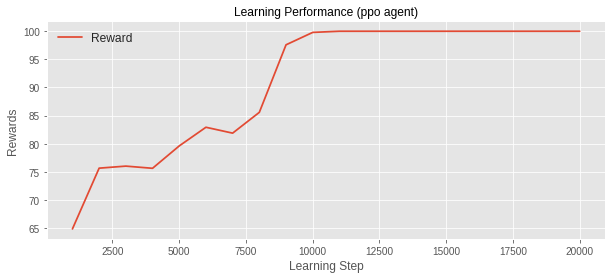

In [12]:
fig, ax = plt.subplots(figsize=(10,4))
plt.style.use('seaborn')
plt.title('Learning Performance (' + str(slicing_agent.agent_algorithm) + ' agent)')
plt.plot(np.arange(1,len(normalized_np_slicing)+1)[0:20]*1000, normalized_np_slicing[0:20], label='Reward', marker="", linestyle="-")#, color='k')
plt.xlabel('Learning Step')
plt.ylabel('Rewards')
plt.legend(prop={'size': 12})